#Data Preprocessing and Analysis

In [50]:
from __future__ import print_function
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report
from sklearn import metrics
from sklearn import tree
import warnings
warnings.filterwarnings('ignore')

In [51]:
df = pd.read_csv('/content/Crop_recommendation.csv')

In [52]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2200 entries, 0 to 2199
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   N            2200 non-null   int64  
 1   P            2200 non-null   int64  
 2   K            2200 non-null   int64  
 3   temperature  2200 non-null   float64
 4   humidity     2200 non-null   float64
 5   ph           2200 non-null   float64
 6   rainfall     2200 non-null   float64
 7   label        2200 non-null   object 
dtypes: float64(4), int64(3), object(1)
memory usage: 137.6+ KB
None


In [53]:
df.head()

,N,P,K,temperature,humidity,ph,rainfall,label
0,90,42,43,20.879744,82.002744,6.502985,202.935536,rice
1,85,58,41,21.770462,80.319644,7.038096,226.655537,rice
2,60,55,44,23.004459,82.320763,7.840207,263.964248,rice
3,74,35,40,26.491096,80.158363,6.980401,242.864034,rice
4,78,42,42,20.130175,81.604873,7.628473,262.717340,rice


In [54]:
df.tail()

,N,P,K,temperature,humidity,ph,rainfall,label
2195,107,34,32,26.774637,66.413269,6.780064,177.774507,coffee
2196,99,15,27,27.417112,56.636362,6.086922,127.924610,coffee
2197,118,33,30,24.131797,67.225123,6.362608,173.322839,coffee
2198,117,32,34,26.272418,52.127394,6.758793,127.175293,coffee
2199,104,18,30,23.603016,60.396475,6.779833,140.937041,coffee


In [55]:
df.describe()

,N,P,K,temperature,humidity,ph,rainfall
count,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000
mean,50.551818,53.362727,48.149091,25.616244,71.481779,6.469480,103.463655
std,36.917334,32.985883,50.647931,5.063749,22.263812,0.773938,54.958389
min,0.000000,5.000000,5.000000,8.825675,14.258040,3.504752,20.211267
25%,21.000000,28.000000,20.000000,22.769375,60.261953,5.971693,64.551686
50%,37.000000,51.000000,32.000000,25.598693,80.473146,6.425045,94.867624
75%,84.250000,68.000000,49.000000,28.561654,89.948771,6.923643,124.267508
max,140.000000,145.000000,205.000000,43.675493,99.981876,9.935091,298.560117


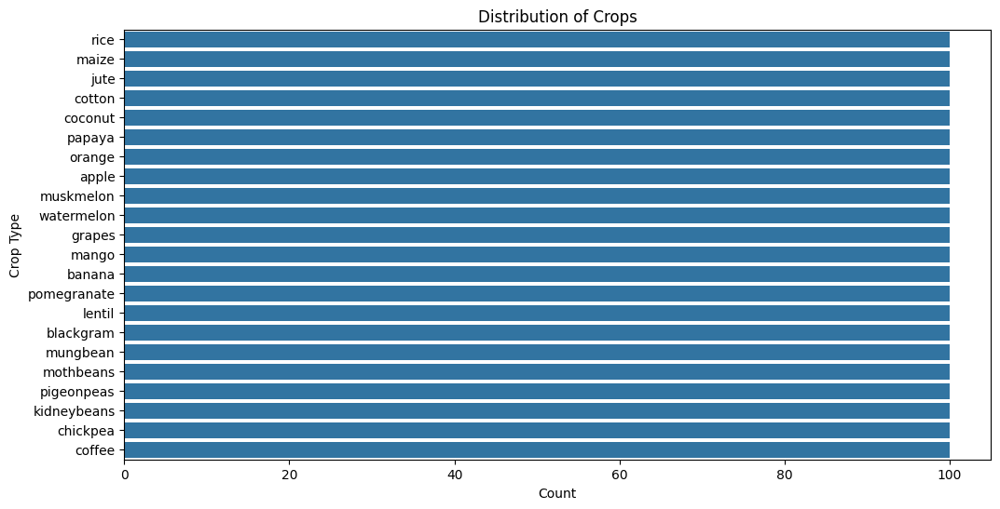

In [56]:
plt.figure(figsize=(12, 6))
sns.countplot(y=df['label'], order=df['label'].value_counts().index)
plt.title('Distribution of Crops')
plt.xlabel('Count')
plt.ylabel('Crop Type')
plt.show()

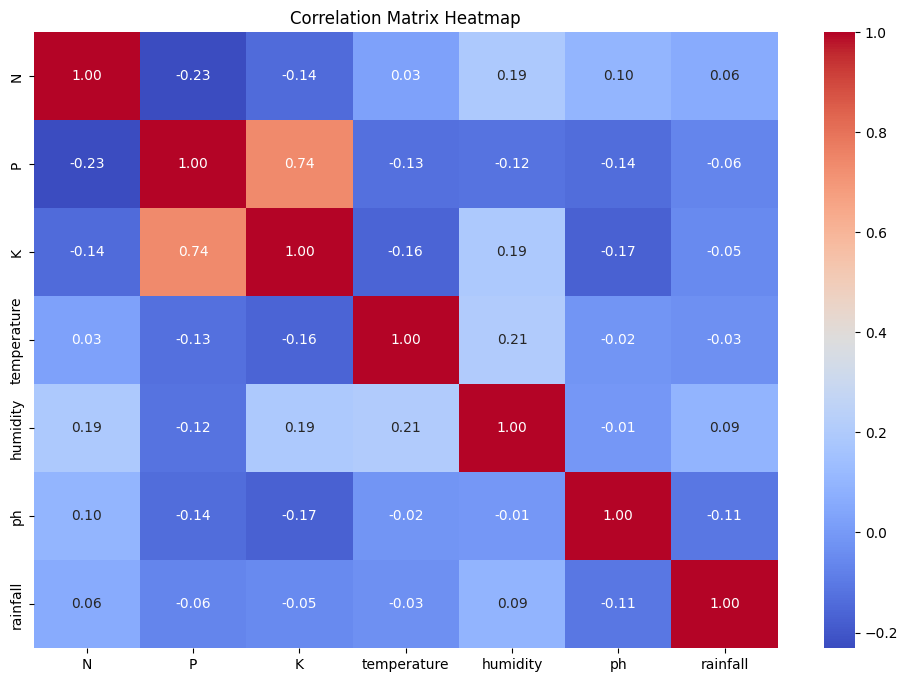

In [57]:
plt.figure(figsize=(12, 8))
dftemp=df.drop('label',axis=1)
correlation_matrix = dftemp.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap')
plt.show()

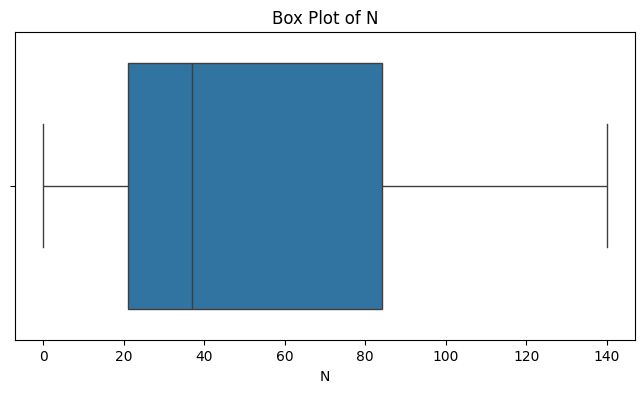

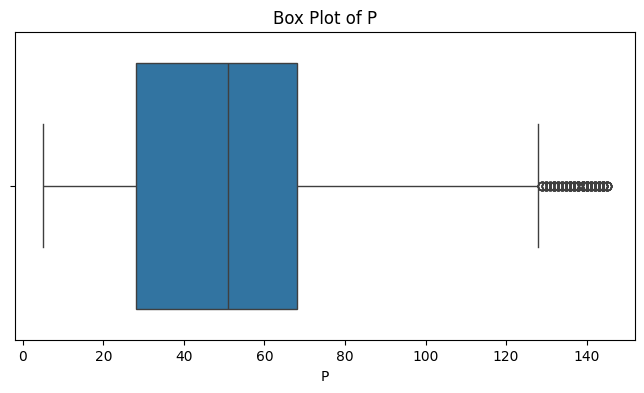

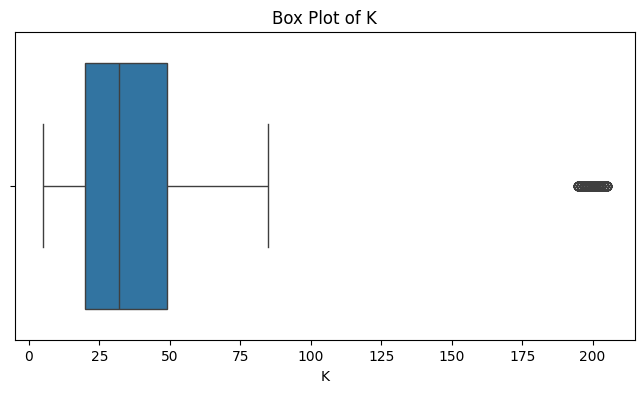

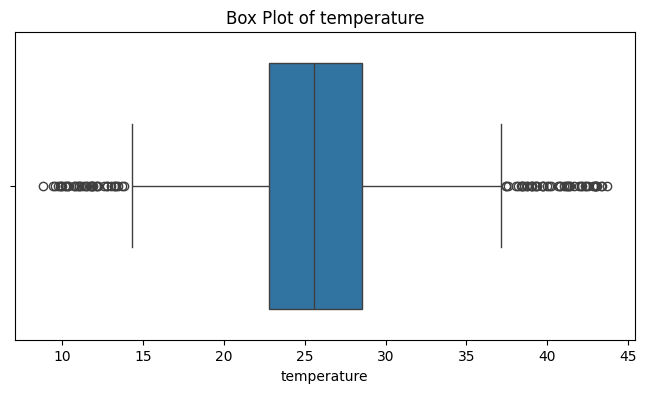

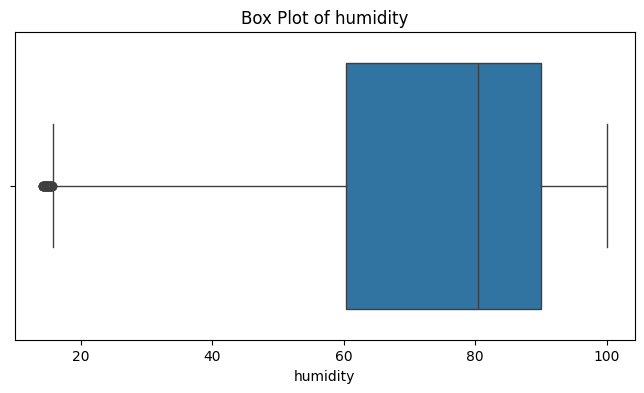

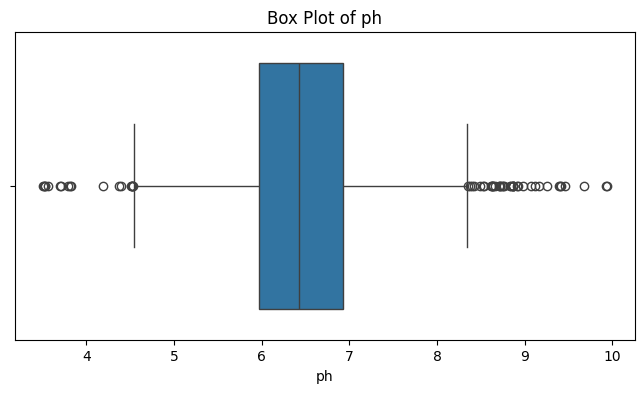

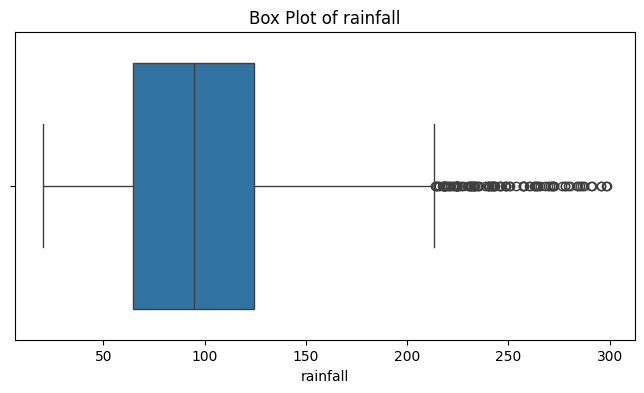

In [58]:
numerical_features = ['N', 'P', 'K', 'temperature', 'humidity', 'ph', 'rainfall']
for feature in numerical_features:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[feature])
    plt.title(f'Box Plot of {feature}')
    plt.xlabel(feature)
    plt.show()

<Figure size 1200x800 with 0 Axes>

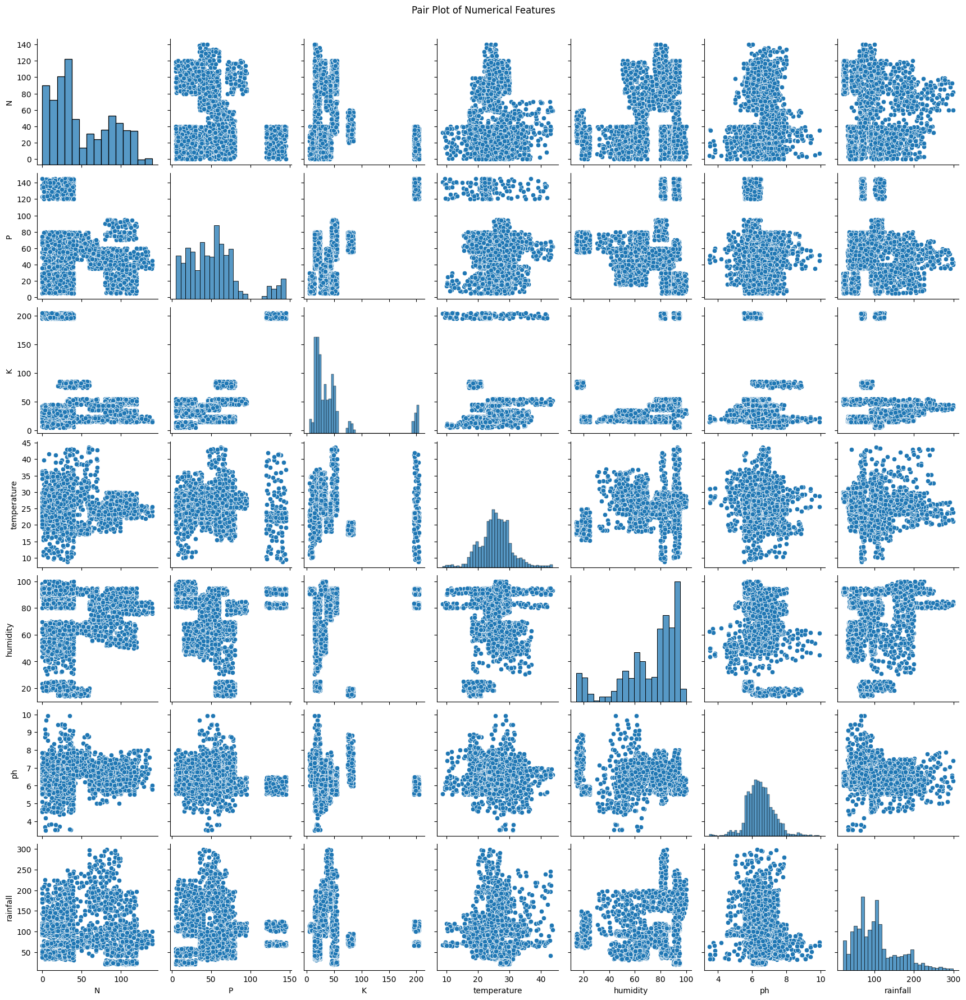

In [59]:
plt.figure(figsize=(12, 8))
sns.pairplot(df[numerical_features])
plt.suptitle('Pair Plot of Numerical Features', y=1.02)
plt.show()

In [60]:
df['label'].unique()

array(['rice', 'maize', 'chickpea', 'kidneybeans', 'pigeonpeas',
       'mothbeans', 'mungbean', 'blackgram', 'lentil', 'pomegranate',
       'banana', 'mango', 'grapes', 'watermelon', 'muskmelon', 'apple',
       'orange', 'papaya', 'coconut', 'cotton', 'jute', 'coffee'],
      dtype=object)

In [61]:
df['label'].value_counts()

,count
label,
rice,100
maize,100
jute,100
cotton,100
coconut,100
papaya,100
orange,100
apple,100
muskmelon,100


# Splitting data



In [62]:
features = df[['N', 'P','K','temperature', 'humidity', 'ph', 'rainfall']]
target = df['label']
labels = df['label']

In [63]:
acc = []
model = []

In [64]:
from sklearn.model_selection import train_test_split
Xtrain, Xtest, Ytrain, Ytest = train_test_split(features,target,test_size = 0.2,random_state =2)

# Decision Tree

In [65]:
from sklearn.tree import DecisionTreeClassifier

DecisionTree = DecisionTreeClassifier(criterion="entropy",random_state=2,max_depth=5)

DecisionTree.fit(Xtrain,Ytrain)

predicted_values = DecisionTree.predict(Xtest)
x = metrics.accuracy_score(Ytest, predicted_values)
acc.append(x)
model.append('Decision Tree')
print("DecisionTrees's Accuracy is: ", x*100)

print(classification_report(Ytest,predicted_values))

DecisionTrees's Accuracy is:  90.0
              precision    recall  f1-score   support

       apple       1.00      1.00      1.00        13
      banana       1.00      1.00      1.00        17
   blackgram       0.59      1.00      0.74        16
    chickpea       1.00      1.00      1.00        21
     coconut       0.91      1.00      0.95        21
      coffee       1.00      1.00      1.00        22
      cotton       1.00      1.00      1.00        20
      grapes       1.00      1.00      1.00        18
        jute       0.74      0.93      0.83        28
 kidneybeans       0.00      0.00      0.00        14
      lentil       0.68      1.00      0.81        23
       maize       1.00      1.00      1.00        21
       mango       1.00      1.00      1.00        26
   mothbeans       0.00      0.00      0.00        19
    mungbean       1.00      1.00      1.00        24
   muskmelon       1.00      1.00      1.00        23
      orange       1.00      1.00      1.00   

In [66]:
from sklearn.model_selection import cross_val_score

In [67]:
score = cross_val_score(DecisionTree, features, target,cv=5)

In [68]:
score

array([0.93636364, 0.90909091, 0.91818182, 0.87045455, 0.93636364])

In [69]:
from sklearn.metrics import accuracy_score

dt_accs = []
for _ in range(3):
    Xtrain, Xtest, Ytrain, Ytest = train_test_split(features, target, test_size=0.2, random_state=np.random.randint(100))
    DecisionTree.fit(Xtrain, Ytrain)
    predicted_values = DecisionTree.predict(Xtest)
    acc_dt = accuracy_score(Ytest, predicted_values)
    dt_accs.append(acc_dt)

dt_mean = np.mean(dt_accs)
dt_std = np.std(dt_accs)
print(f"Decision Tree Mean Accuracy: {dt_mean}, Std Deviation: {dt_std}")

Decision Tree Mean Accuracy: 0.896969696969697, Std Deviation: 0.02840656554432224


# Guassian Naive Bayes

In [70]:
from sklearn.naive_bayes import GaussianNB

NaiveBayes = GaussianNB()

NaiveBayes.fit(Xtrain,Ytrain)

predicted_values = NaiveBayes.predict(Xtest)
x = metrics.accuracy_score(Ytest, predicted_values)
acc.append(x)
model.append('Naive Bayes')
print("Naive Bayes's Accuracy is: ", x)

print(classification_report(Ytest,predicted_values))

Naive Bayes's Accuracy is:  0.9931818181818182
              precision    recall  f1-score   support

       apple       1.00      1.00      1.00        19
      banana       1.00      1.00      1.00        28
   blackgram       1.00      1.00      1.00        25
    chickpea       1.00      1.00      1.00        20
     coconut       1.00      1.00      1.00        18
      coffee       1.00      1.00      1.00        13
      cotton       1.00      1.00      1.00        14
      grapes       1.00      1.00      1.00        18
        jute       0.81      1.00      0.90        13
 kidneybeans       1.00      1.00      1.00        27
      lentil       1.00      1.00      1.00        20
       maize       1.00      1.00      1.00        22
       mango       1.00      1.00      1.00        17
   mothbeans       1.00      1.00      1.00        24
    mungbean       1.00      1.00      1.00        17
   muskmelon       1.00      1.00      1.00        16
      orange       1.00      1.00 

In [71]:
score = cross_val_score(NaiveBayes,features,target,cv=5)
score

array([0.99772727, 0.99545455, 0.99545455, 0.99545455, 0.99090909])

In [72]:
nb_accs = []
for _ in range(3):
    Xtrain, Xtest, Ytrain, Ytest = train_test_split(features, target, test_size=0.2, random_state=np.random.randint(100))
    NaiveBayes.fit(Xtrain, Ytrain)
    predicted_values = NaiveBayes.predict(Xtest)
    acc_nb = accuracy_score(Ytest, predicted_values)
    nb_accs.append(acc_nb)

nb_mean = np.mean(nb_accs)
nb_std = np.std(nb_accs)
print(f"Naive Bayes Mean Accuracy: {nb_mean}, Std Deviation: {nb_std}")

Naive Bayes Mean Accuracy: 0.9946969696969696, Std Deviation: 0.004285495643554809


# Random Forest

In [73]:
from sklearn.ensemble import RandomForestClassifier

RF = RandomForestClassifier(n_estimators=20, random_state=0)
RF.fit(Xtrain,Ytrain)

predicted_values = RF.predict(Xtest)

x = metrics.accuracy_score(Ytest, predicted_values)
acc.append(x)
model.append('RF')
print("RF's Accuracy is: ", x)

print(classification_report(Ytest,predicted_values))

RF's Accuracy is:  0.9863636363636363
              precision    recall  f1-score   support

       apple       1.00      1.00      1.00        15
      banana       1.00      1.00      1.00        18
   blackgram       0.90      1.00      0.95        18
    chickpea       1.00      1.00      1.00        23
     coconut       1.00      1.00      1.00        19
      coffee       1.00      1.00      1.00        23
      cotton       1.00      1.00      1.00        18
      grapes       1.00      1.00      1.00        31
        jute       0.88      1.00      0.93        14
 kidneybeans       1.00      1.00      1.00        26
      lentil       0.86      1.00      0.92        12
       maize       1.00      1.00      1.00         7
       mango       1.00      1.00      1.00        19
   mothbeans       1.00      0.85      0.92        27
    mungbean       1.00      1.00      1.00        15
   muskmelon       1.00      1.00      1.00        20
      orange       1.00      1.00      1.00

In [74]:
score = cross_val_score(RF,features,target,cv=5)
score

array([0.99772727, 0.99545455, 0.99772727, 0.99318182, 0.98863636])

In [75]:
rf_accs = []
for _ in range(3):
    Xtrain, Xtest, Ytrain, Ytest = train_test_split(features, target, test_size=0.2, random_state=np.random.randint(100))
    RF.fit(Xtrain, Ytrain)
    predicted_values = RF.predict(Xtest)
    acc_rf = accuracy_score(Ytest, predicted_values)
    rf_accs.append(acc_rf)

rf_mean = np.mean(rf_accs)
rf_std = np.std(rf_accs)
print(f"Random Forest Mean Accuracy: {rf_mean}, Std Deviation: {rf_std}")

Random Forest Mean Accuracy: 0.9946969696969697, Std Deviation: 0.0010713739108887284


### Saving trained Random Forest model

# Accuracy Comparison

           Model  Mean Accuracy  Std Deviation
0  Decision Tree       0.896970       0.028407
1    Naive Bayes       0.994697       0.004285
2  Random Forest       0.994697       0.001071


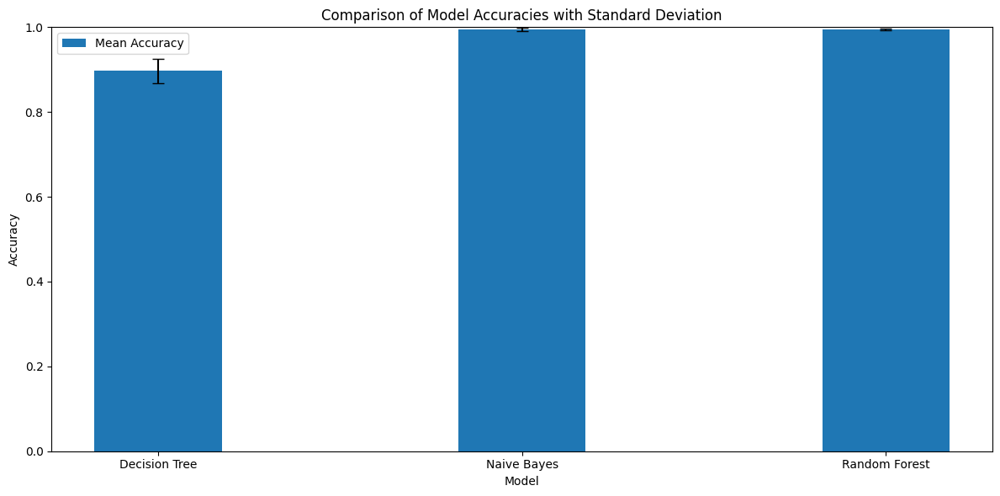

In [76]:
summary_df = pd.DataFrame({
    'Model': ['Decision Tree', 'Naive Bayes', 'Random Forest'],
    'Mean Accuracy': [dt_mean, nb_mean, rf_mean],
    'Std Deviation': [dt_std, nb_std, rf_std]
})

print(summary_df)
plt.figure(figsize=(12, 6))
bar_width = 0.35
index = np.arange(len(summary_df['Model']))

plt.bar(index, summary_df['Mean Accuracy'], bar_width, label='Mean Accuracy', yerr=summary_df['Std Deviation'], capsize=5)
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Comparison of Model Accuracies with Standard Deviation')
plt.xticks(index, summary_df['Model'])
plt.ylim([0, 1])
plt.legend()
plt.tight_layout()
plt.show()

<Axes: title={'center': 'Accuracy Comparison'}, xlabel='Accuracy', ylabel='Algorithm'>

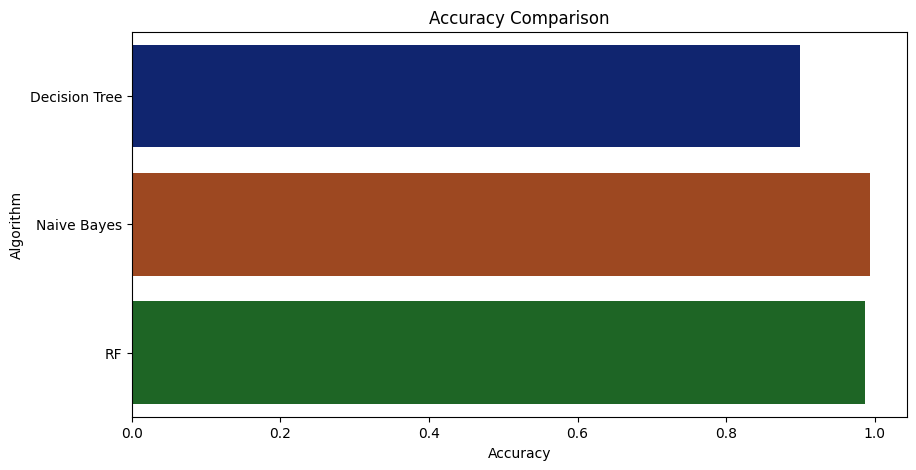

In [77]:
plt.figure(figsize=[10,5],dpi = 100)
plt.title('Accuracy Comparison')
plt.xlabel('Accuracy')
plt.ylabel('Algorithm')
sns.barplot(x = acc,y = model,palette='dark')

In [78]:
accuracy_models = dict(zip(model, acc))
for k, v in accuracy_models.items():
    print (k, '-->', v)

Decision Tree --> 0.9
Naive Bayes --> 0.9931818181818182
RF --> 0.9863636363636363


# Explainable AI (XAI)

In [79]:
import pandas as pd
import xgboost as xgb
import shap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

In [80]:
encoded_labels = pd.get_dummies(df['label'], prefix='label')
data_encoded = pd.concat([df.drop(columns=['label']), encoded_labels], axis=1)
data_encoded.head()


,N,P,K,temperature,humidity,ph,rainfall,label_apple,label_banana,label_blackgram,...,label_mango,label_mothbeans,label_mungbean,label_muskmelon,label_orange,label_papaya,label_pigeonpeas,label_pomegranate,label_rice,label_watermelon
0,90,42,43,20.879744,82.002744,6.502985,202.935536,False,False,False,...,False,False,False,False,False,False,False,False,True,False
1,85,58,41,21.770462,80.319644,7.038096,226.655537,False,False,False,...,False,False,False,False,False,False,False,False,True,False
2,60,55,44,23.004459,82.320763,7.840207,263.964248,False,False,False,...,False,False,False,False,False,False,False,False,True,False
3,74,35,40,26.491096,80.158363,6.980401,242.864034,False,False,False,...,False,False,False,False,False,False,False,False,True,False
4,78,42,42,20.130175,81.604873,7.628473,262.717340,False,False,False,...,False,False,False,False,False,False,False,False,True,False


SHAP Plots for label_apple


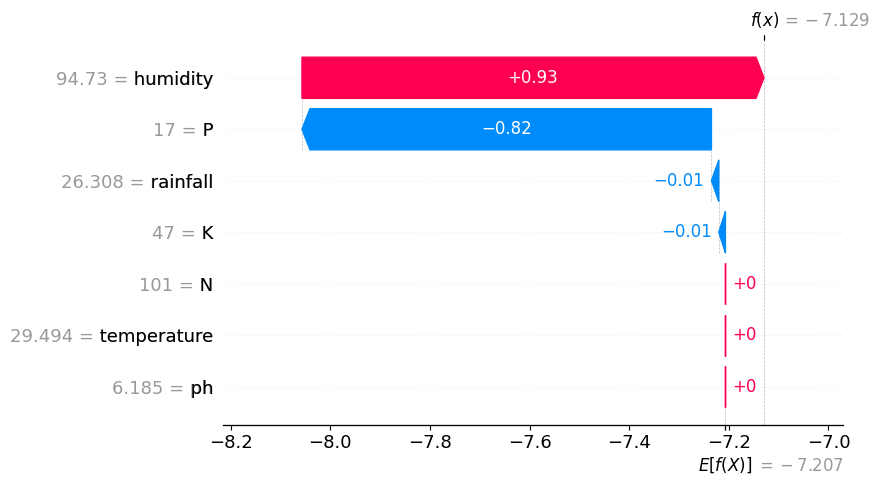

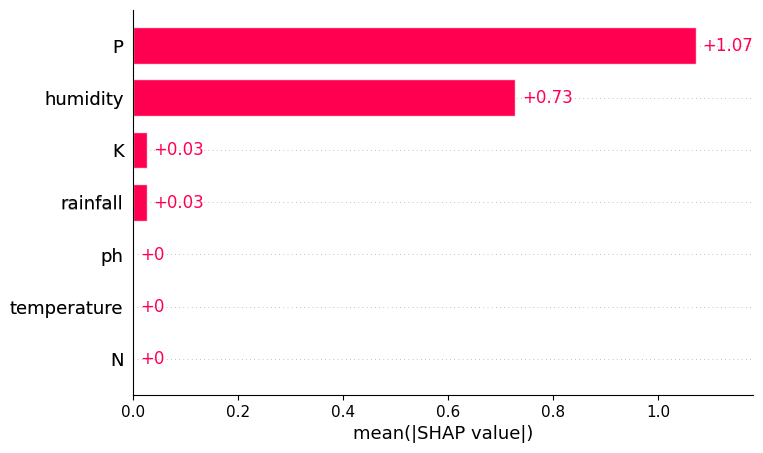

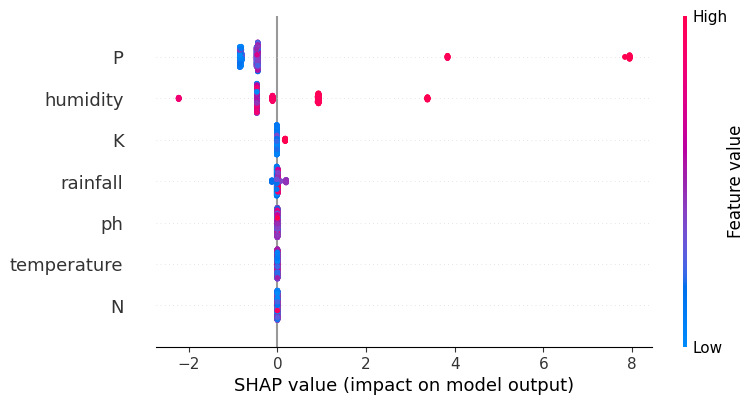

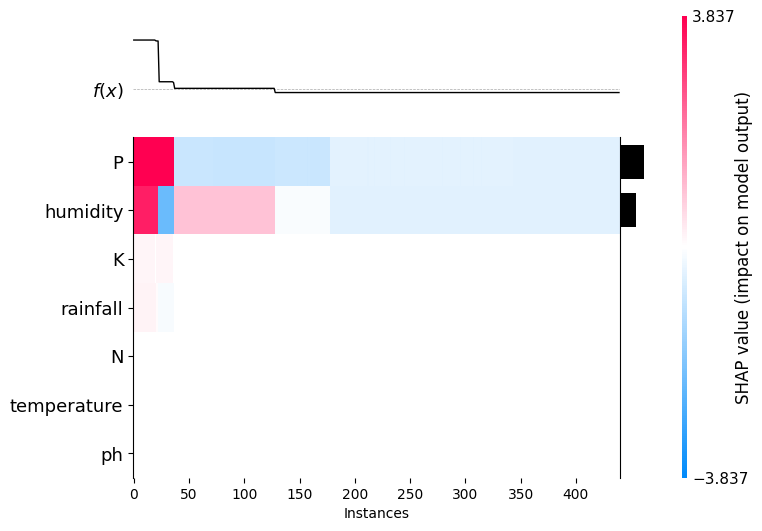

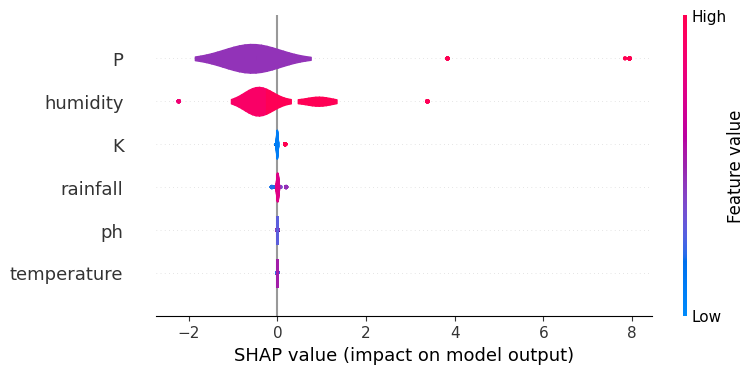

SHAP Plots for label_banana


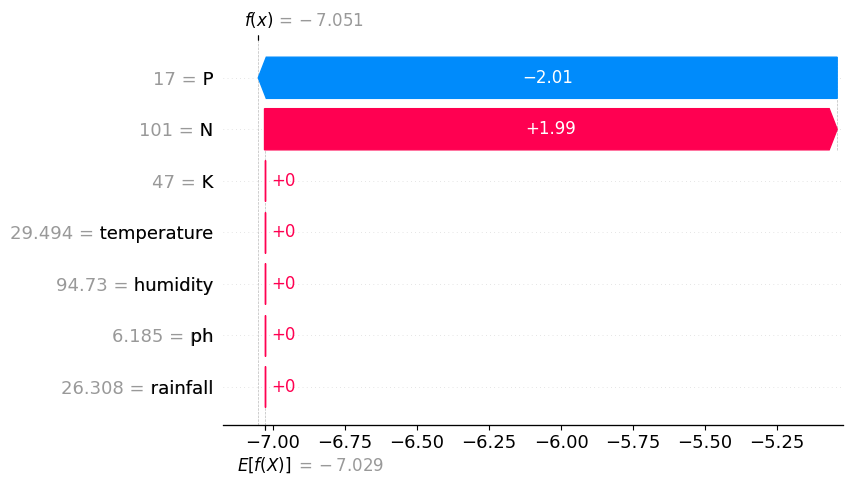

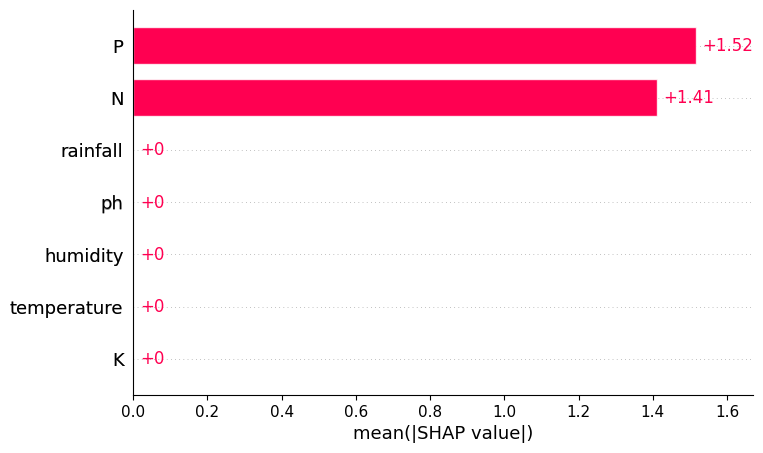

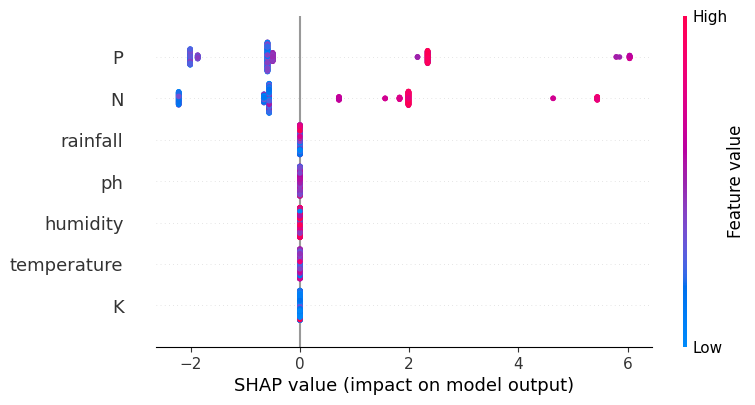

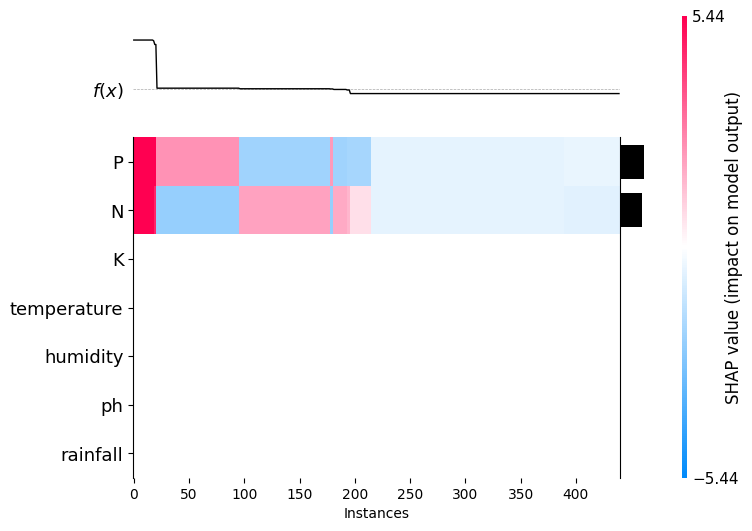

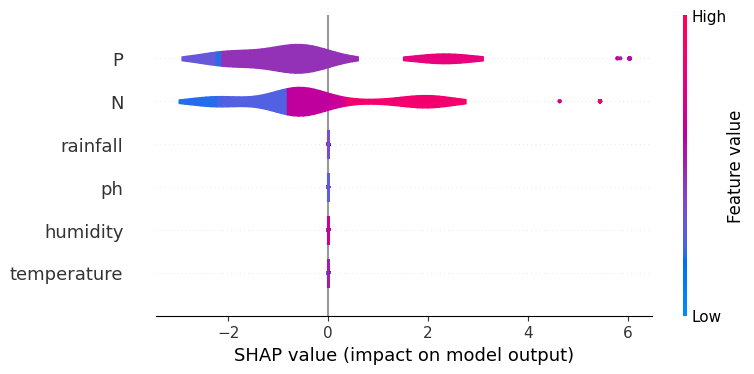

SHAP Plots for label_blackgram


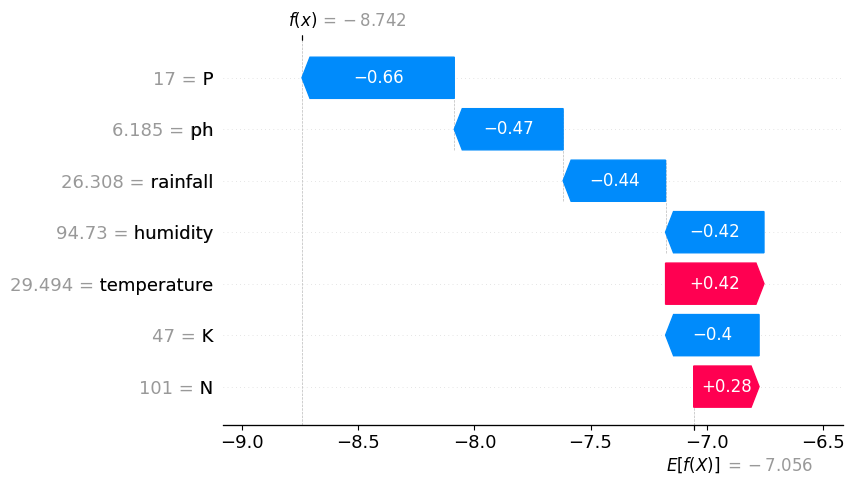

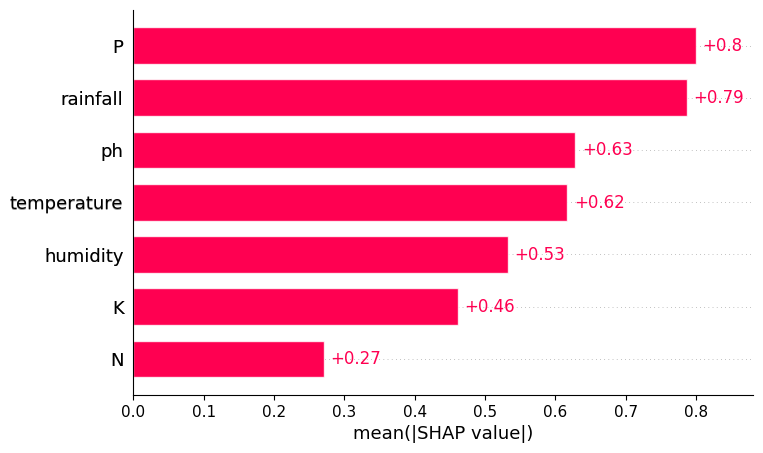

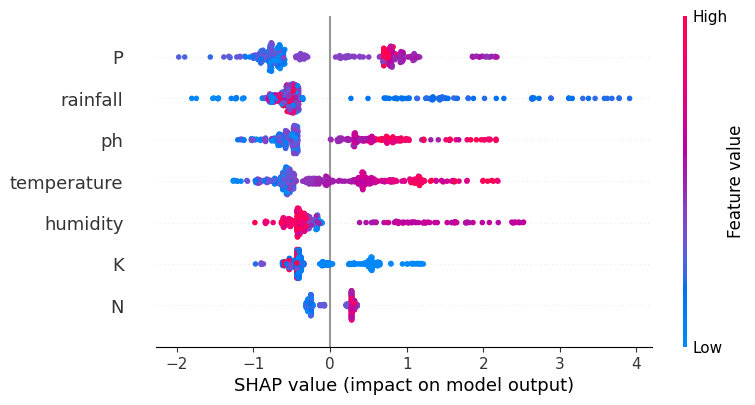

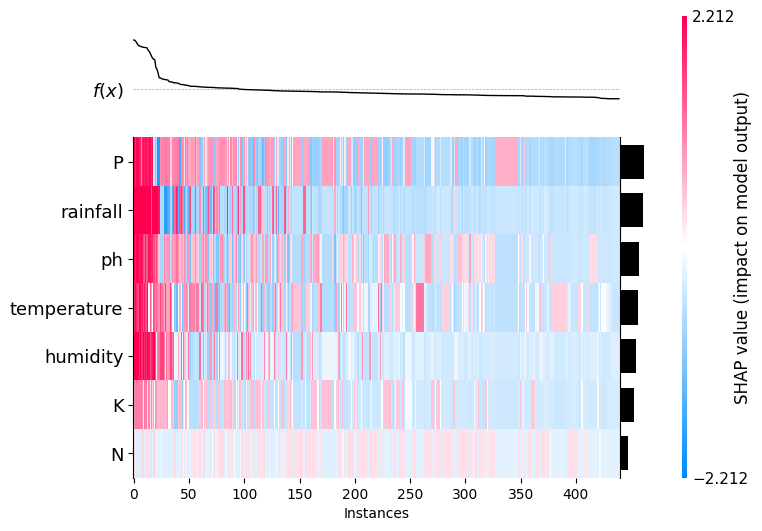

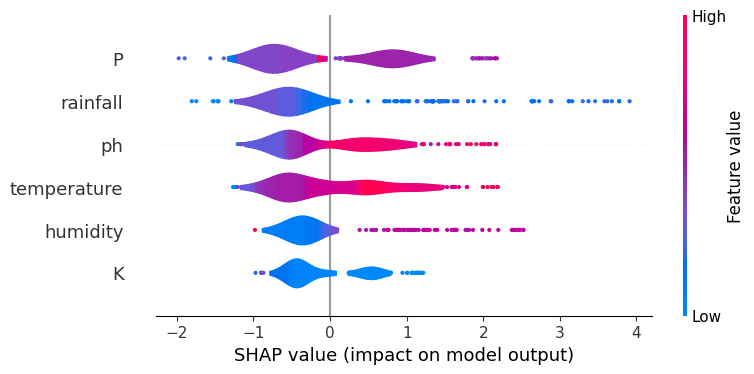

SHAP Plots for label_chickpea


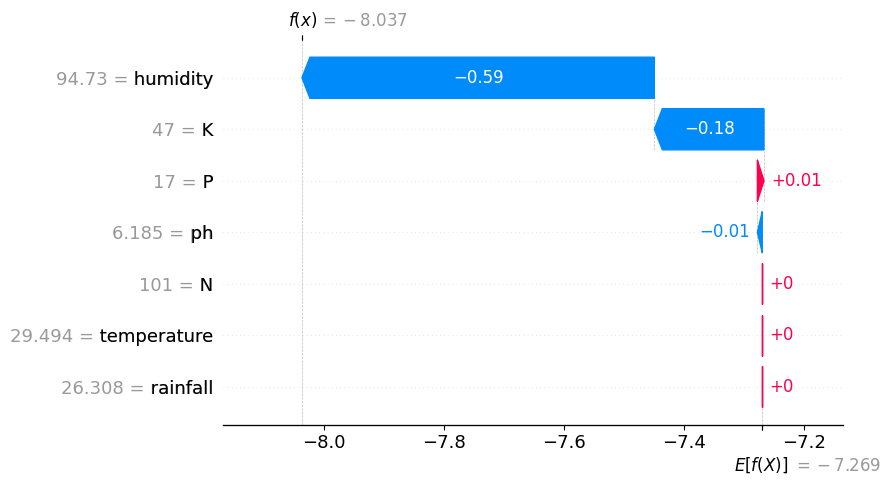

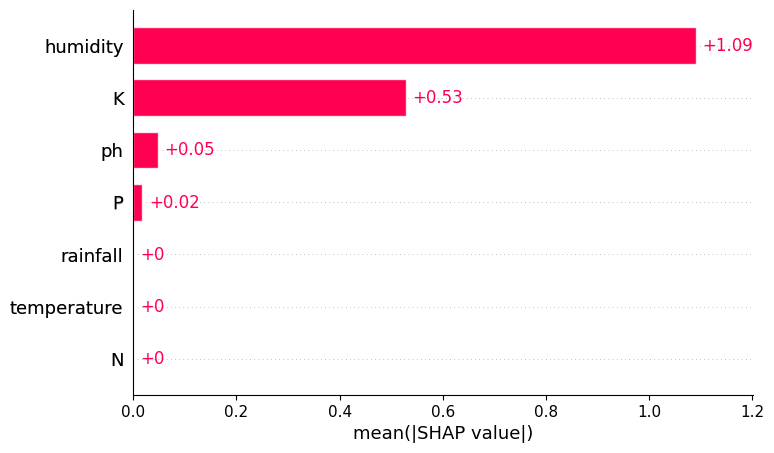

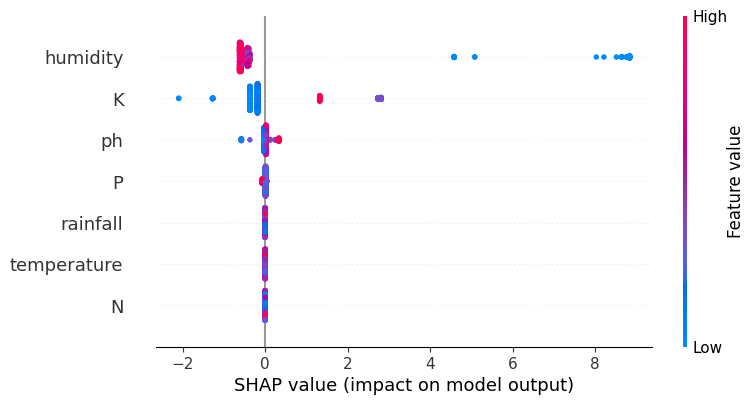

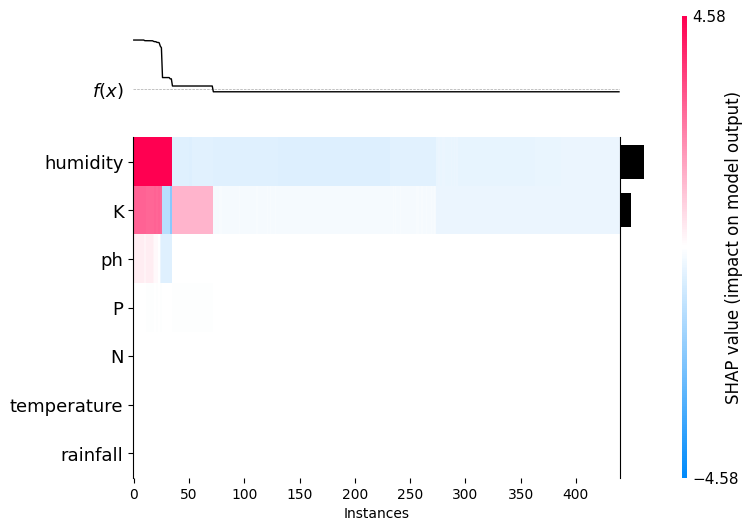

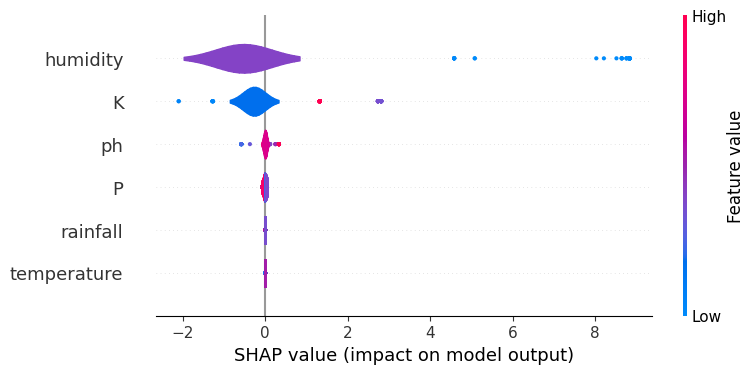

SHAP Plots for label_coconut


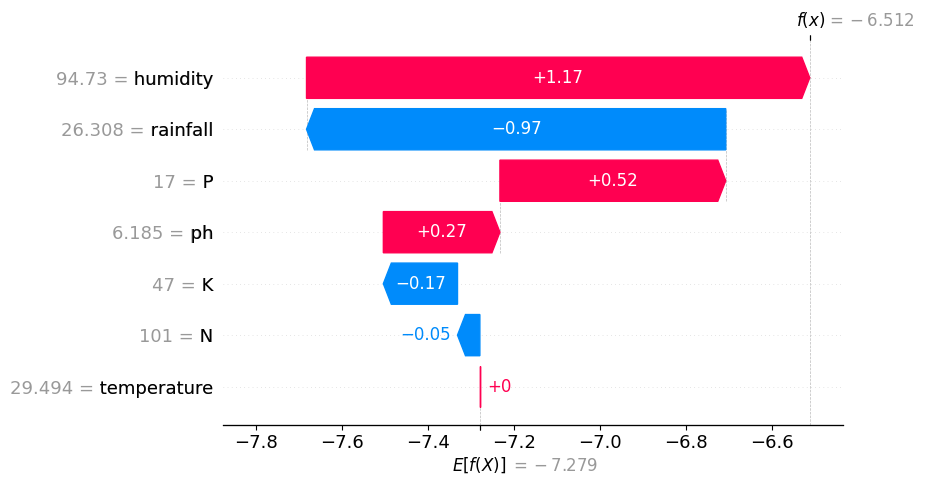

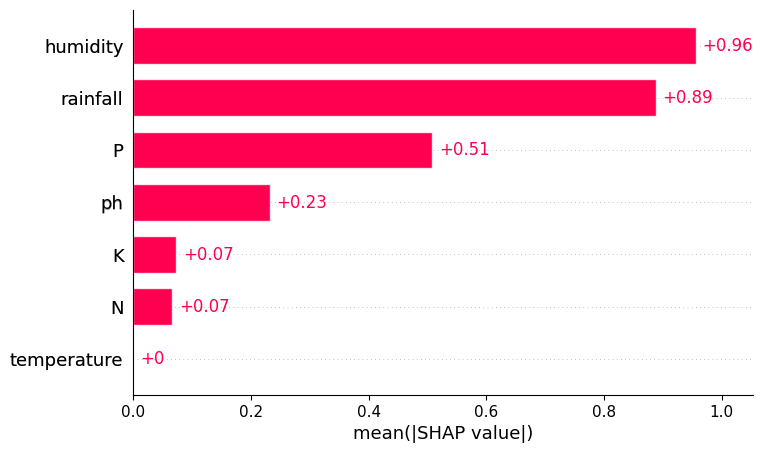

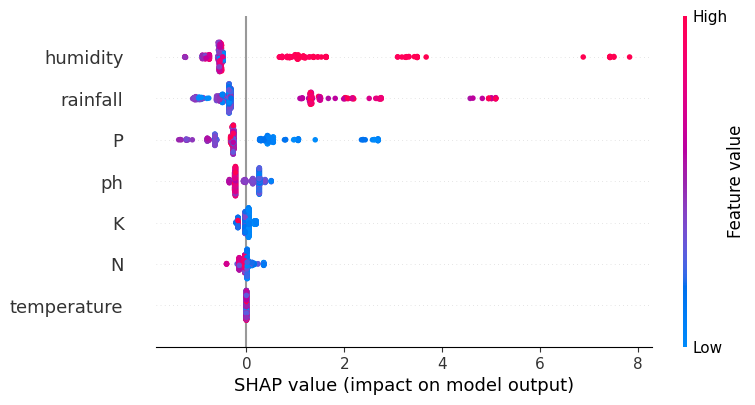

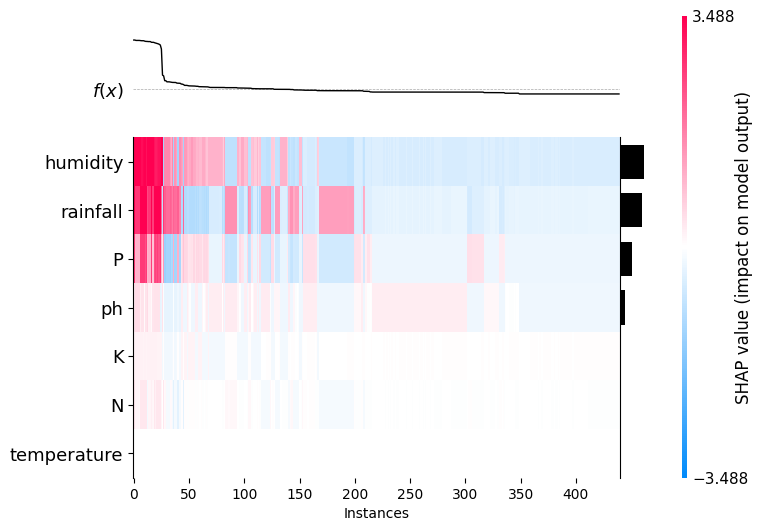

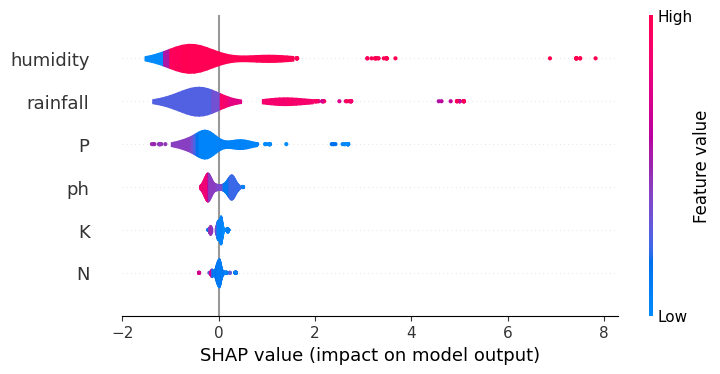

SHAP Plots for label_coffee


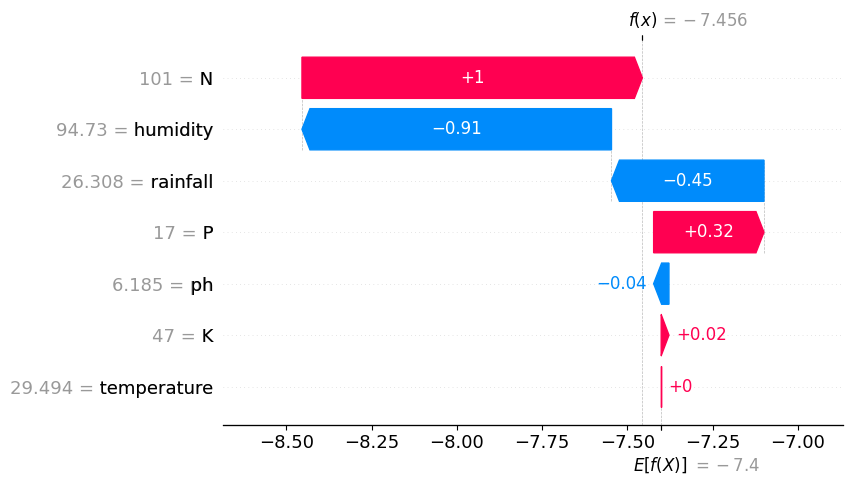

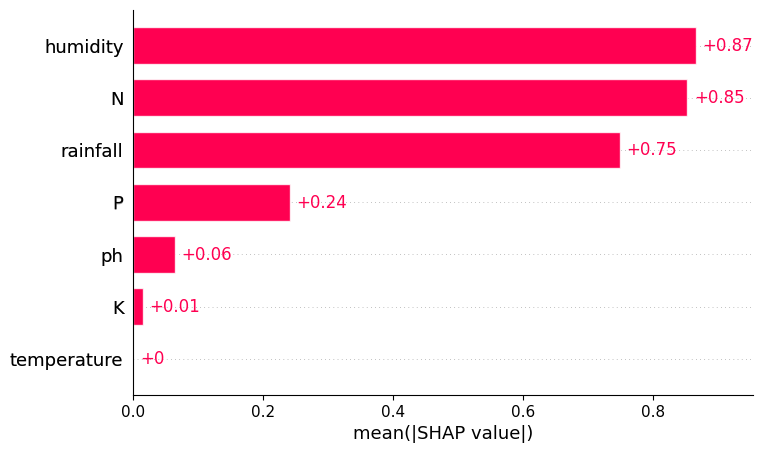

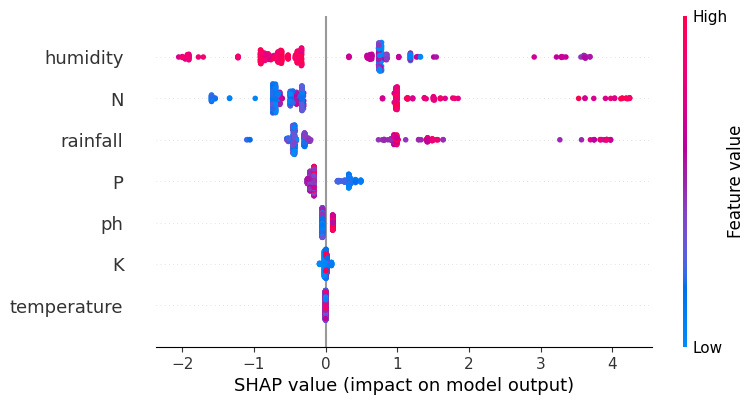

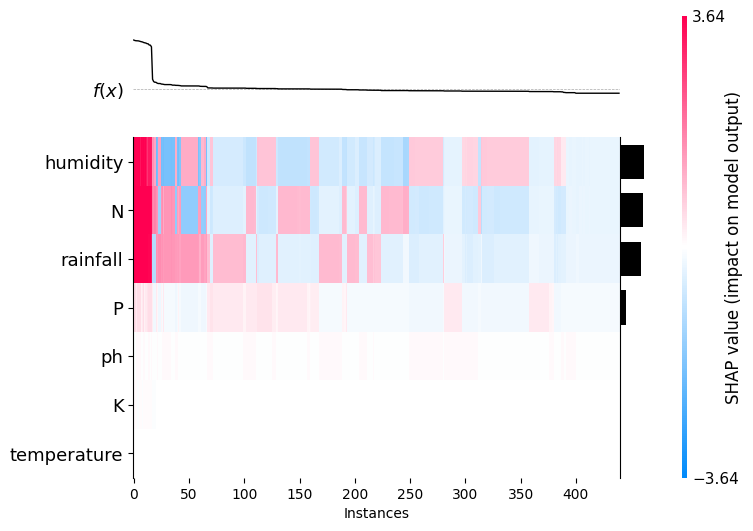

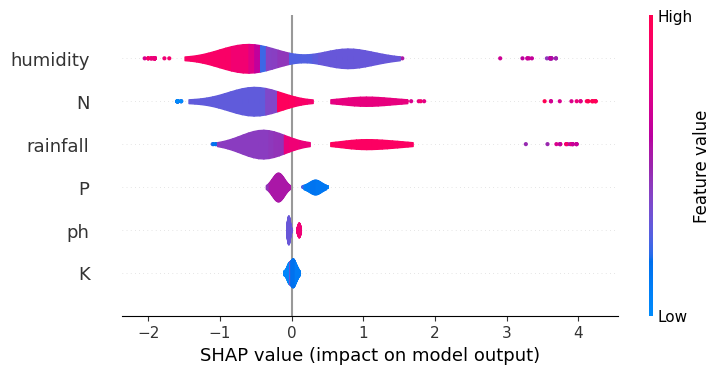

SHAP Plots for label_cotton


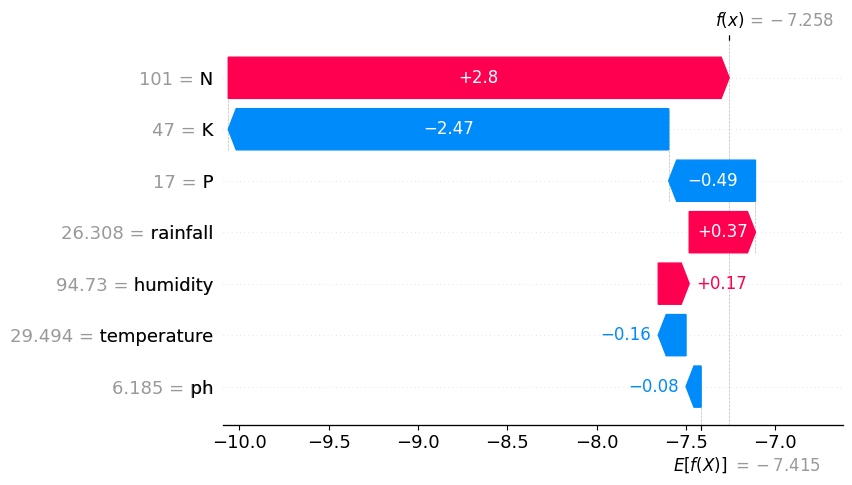

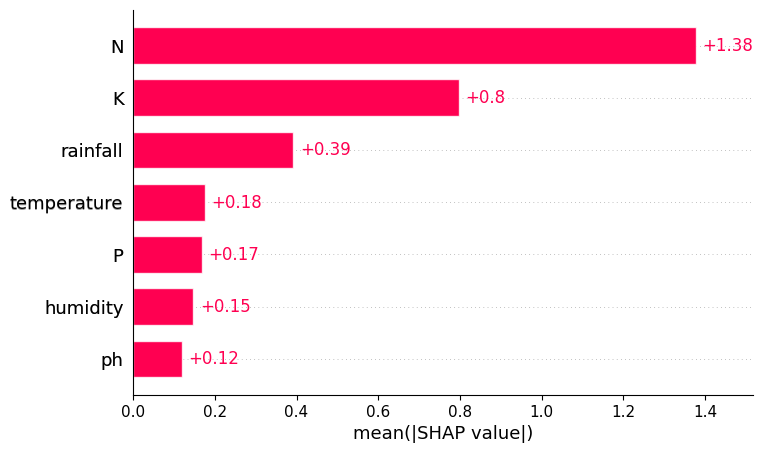

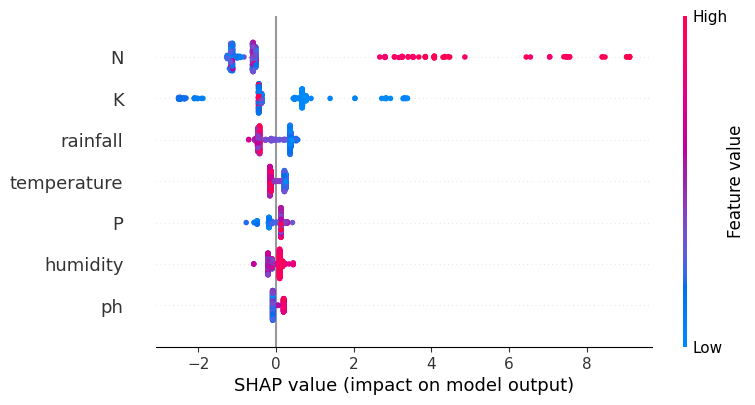

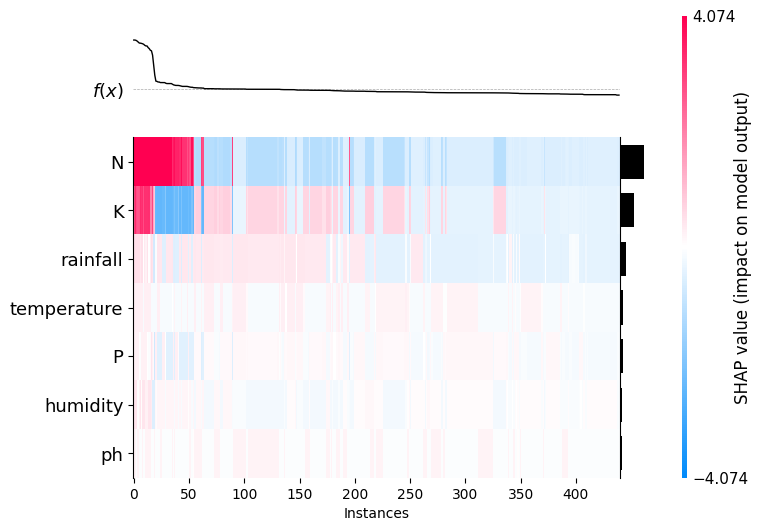

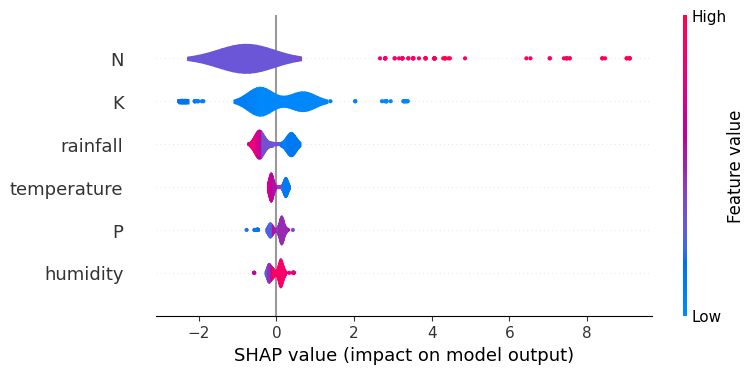

SHAP Plots for label_grapes


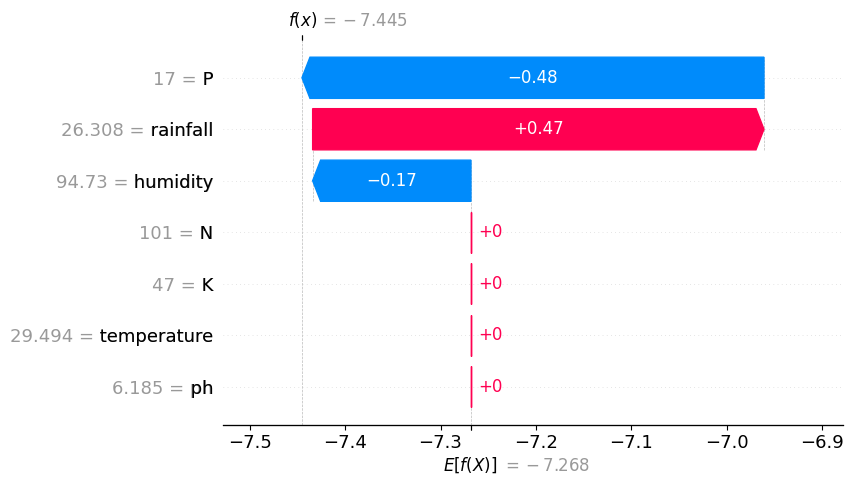

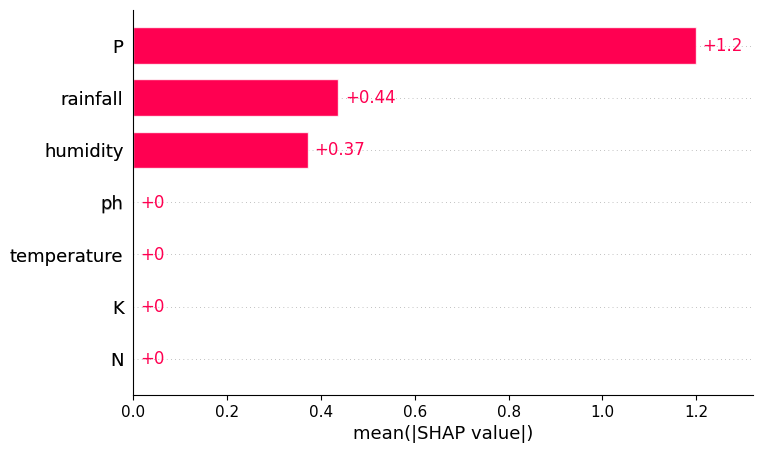

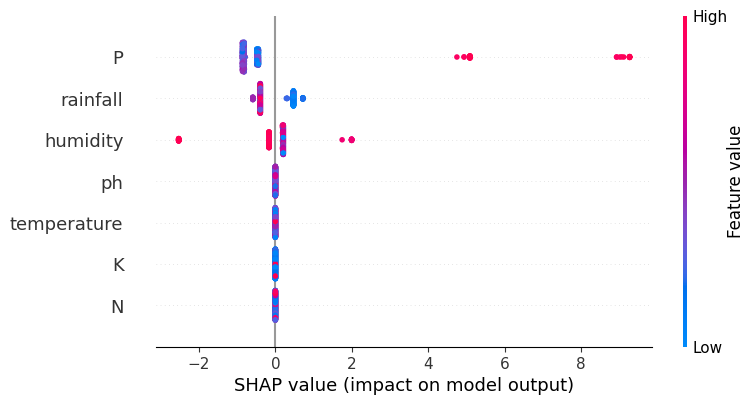

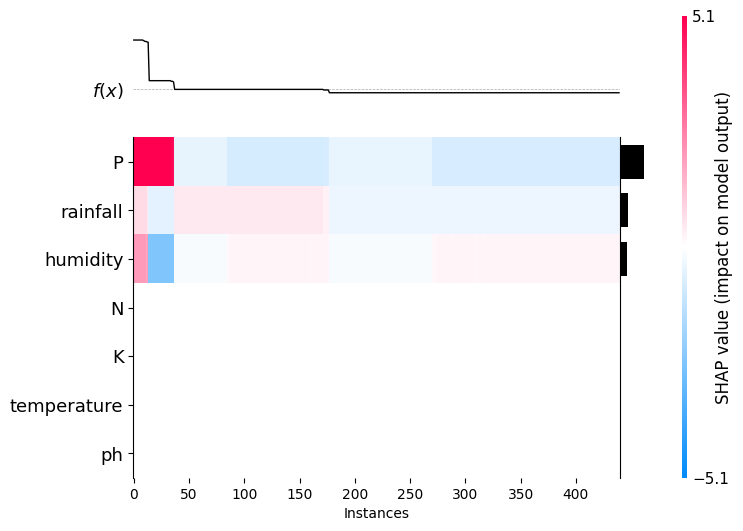

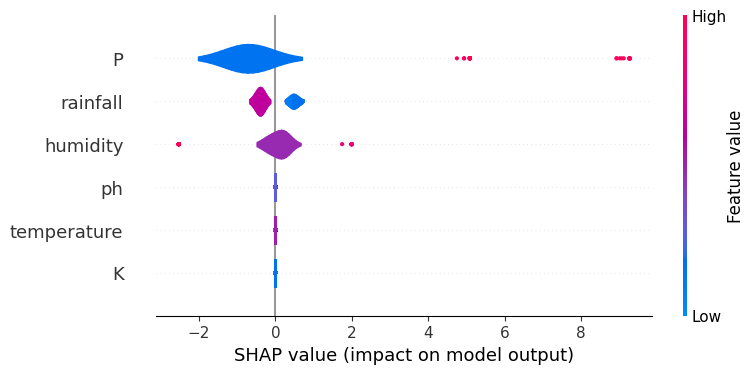

SHAP Plots for label_jute


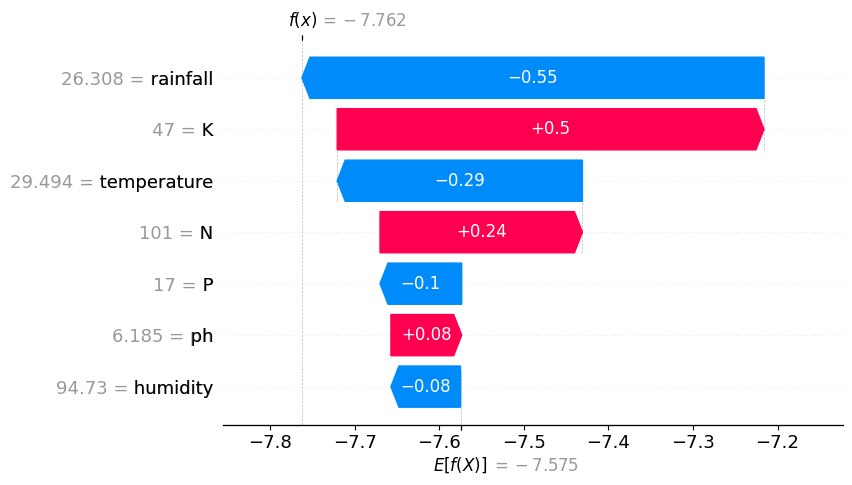

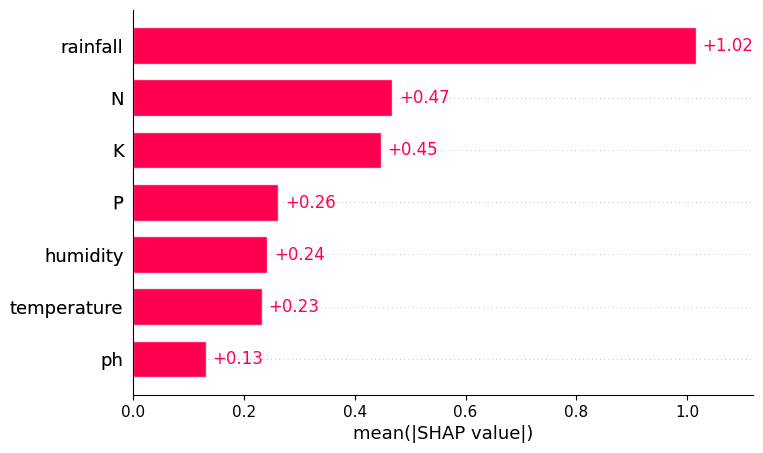

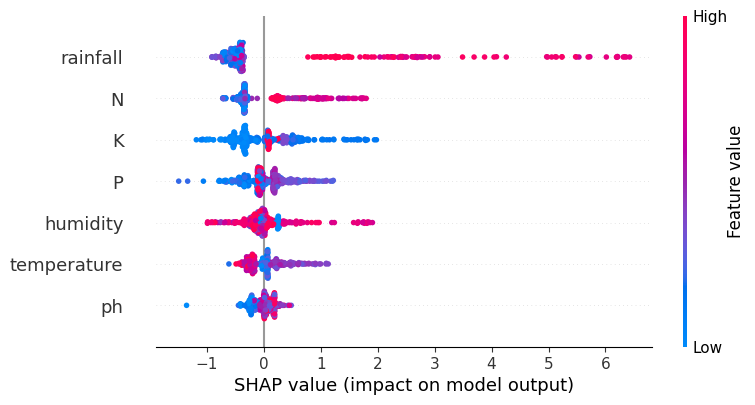

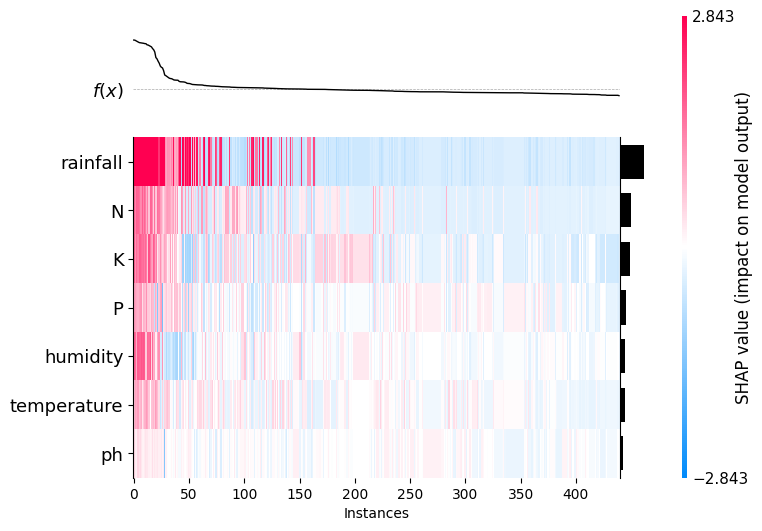

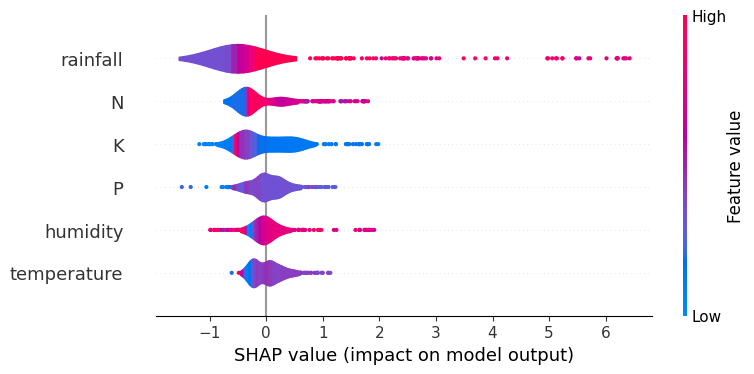

SHAP Plots for label_kidneybeans


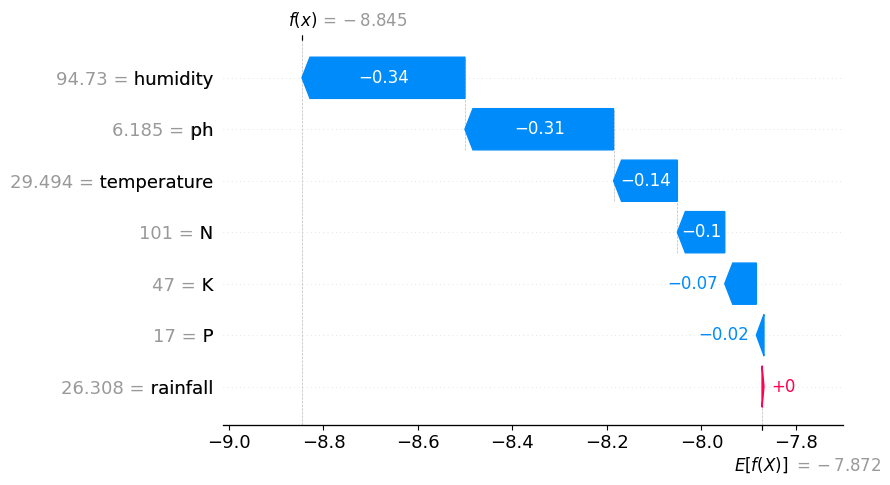

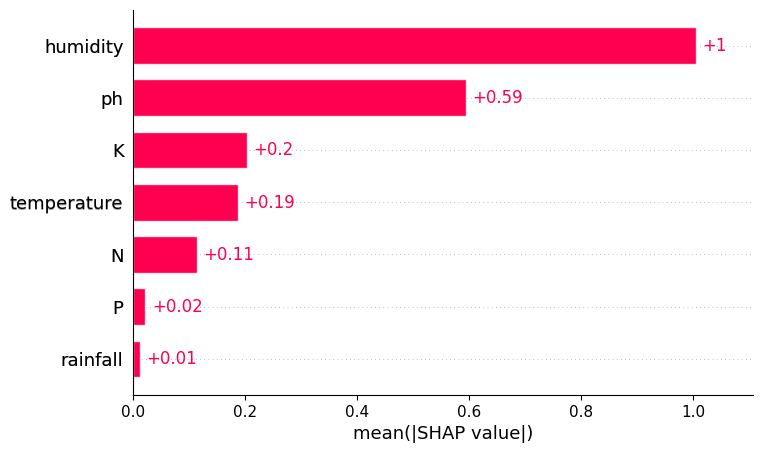

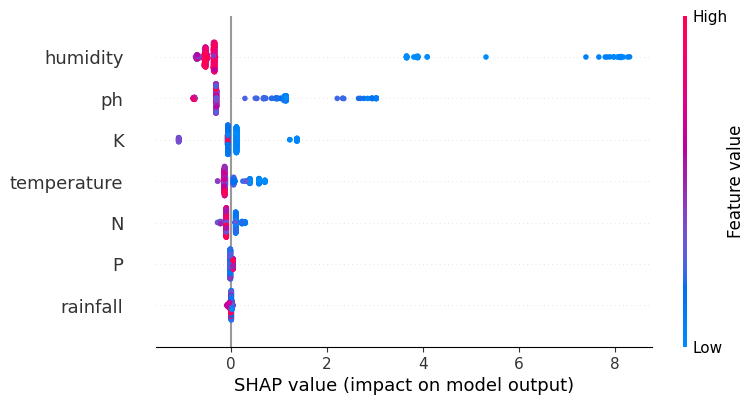

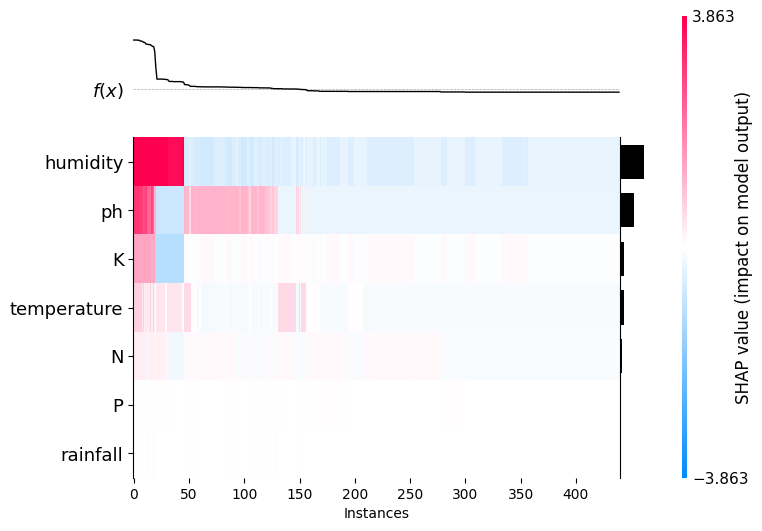

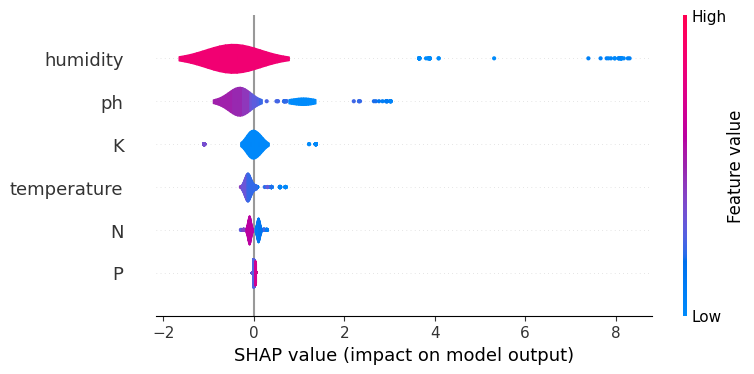

SHAP Plots for label_lentil


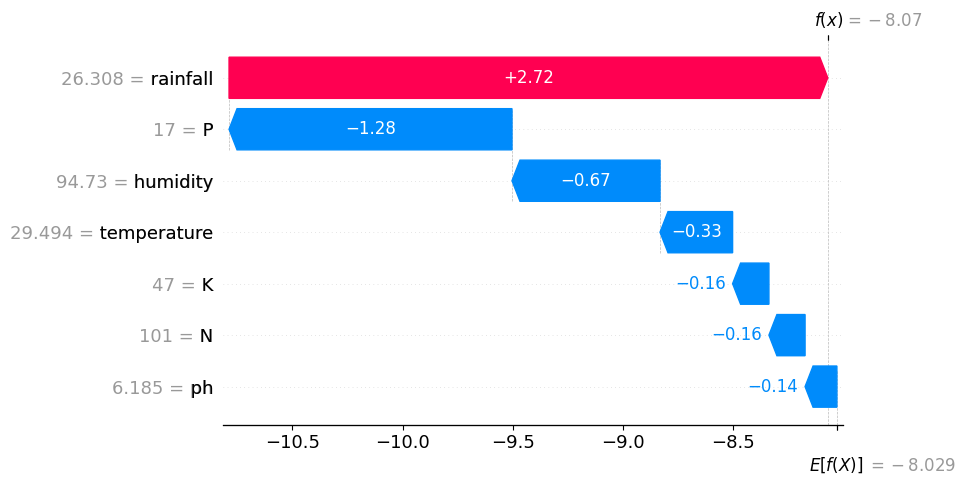

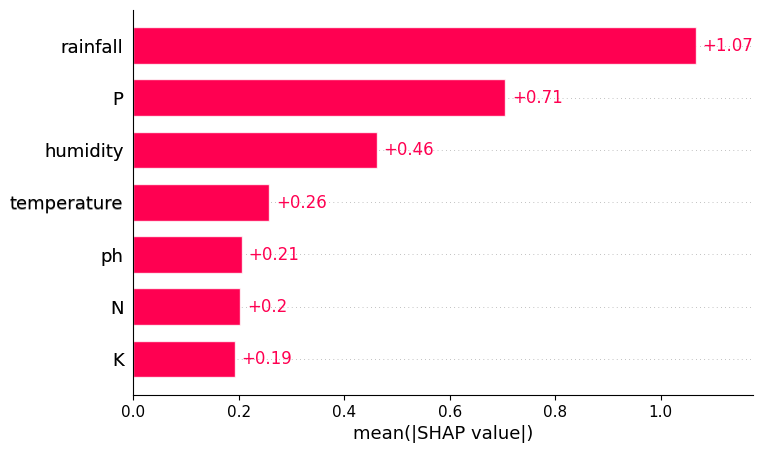

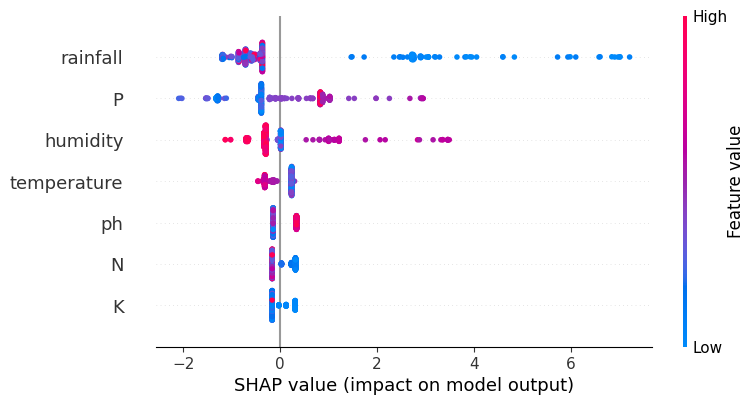

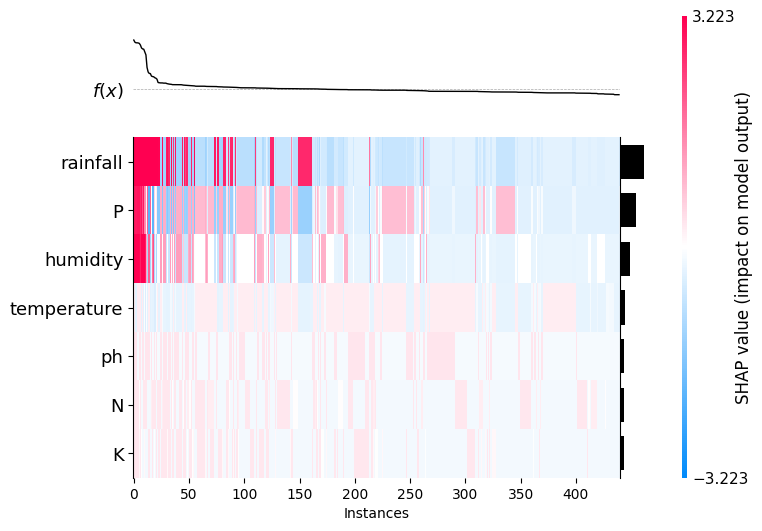

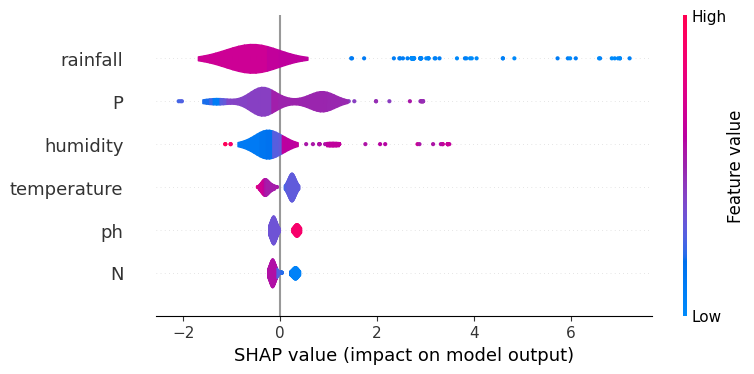

SHAP Plots for label_maize


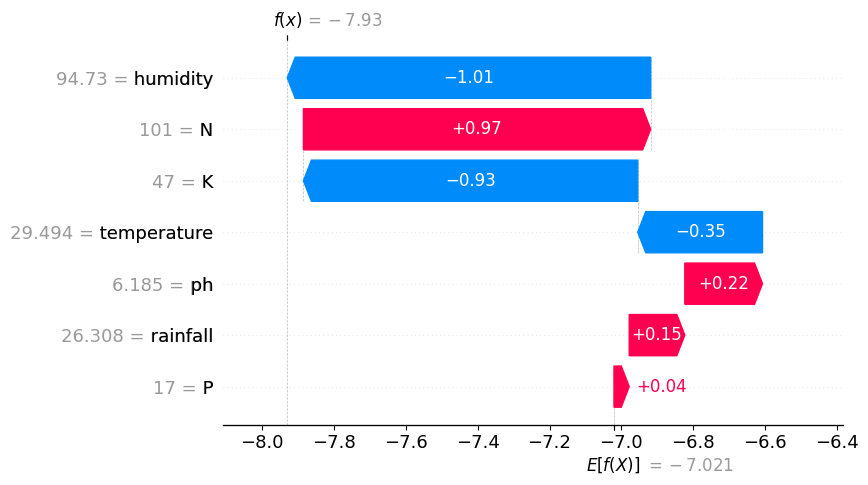

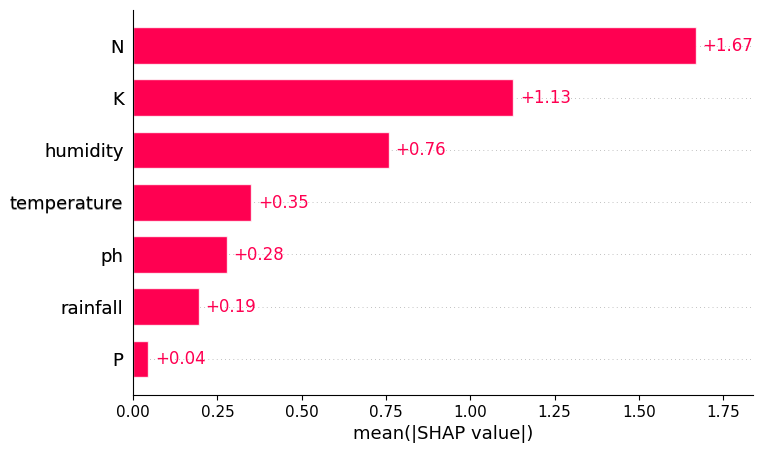

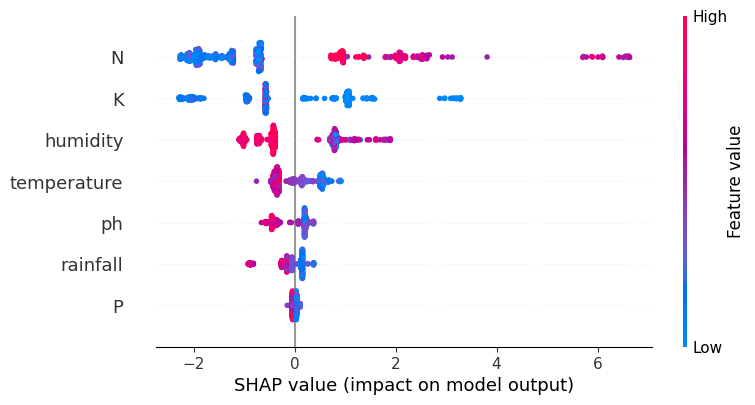

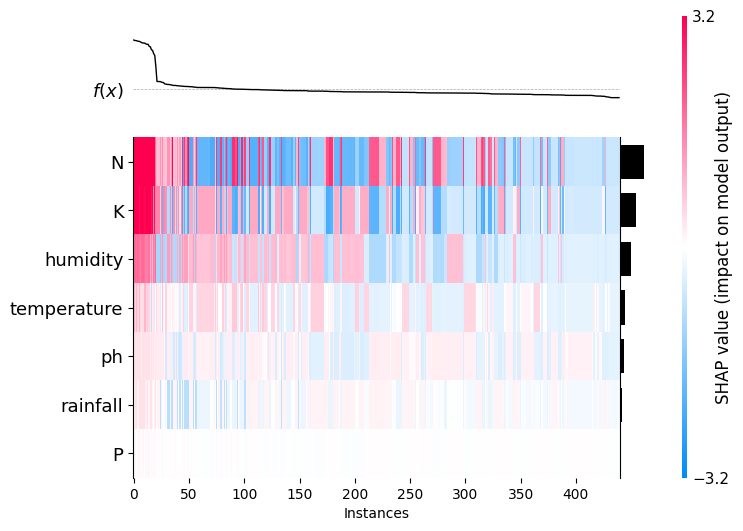

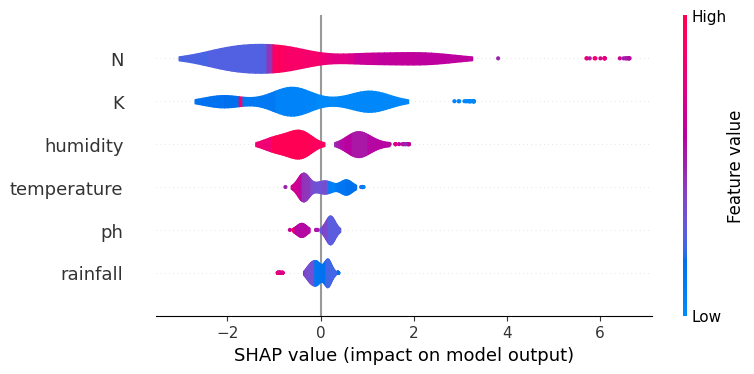

SHAP Plots for label_mango


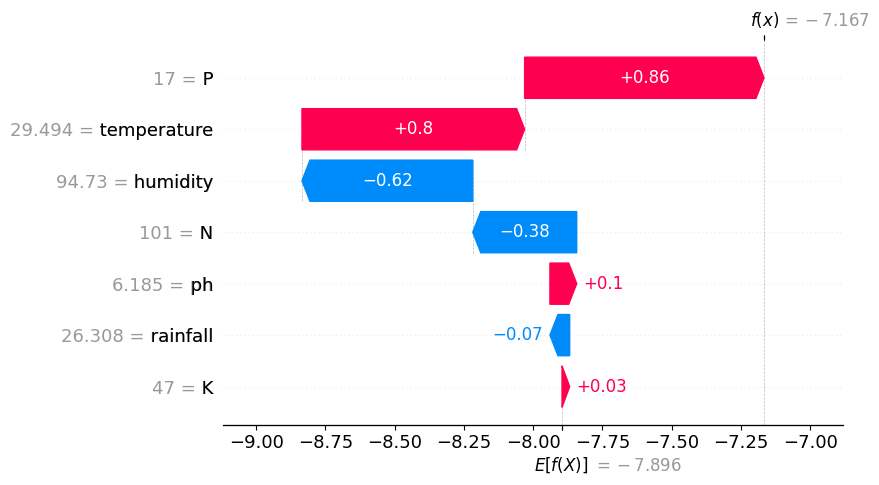

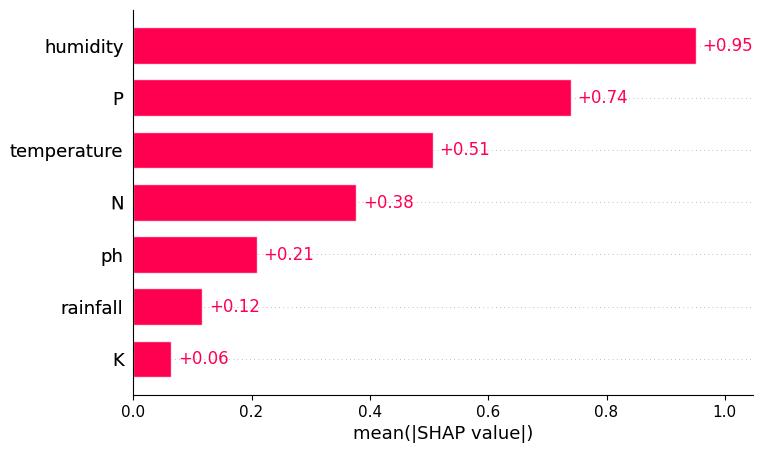

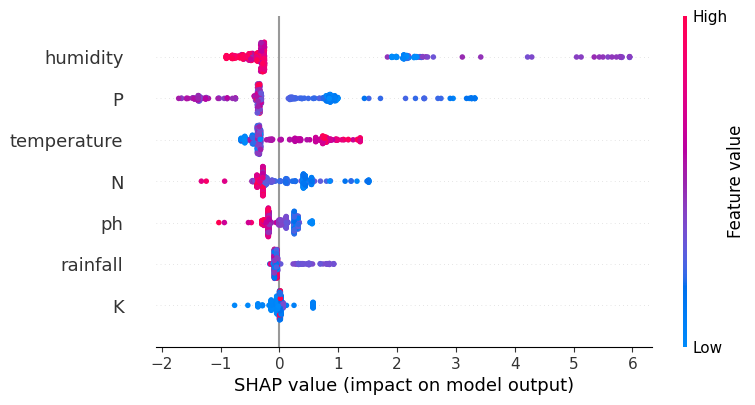

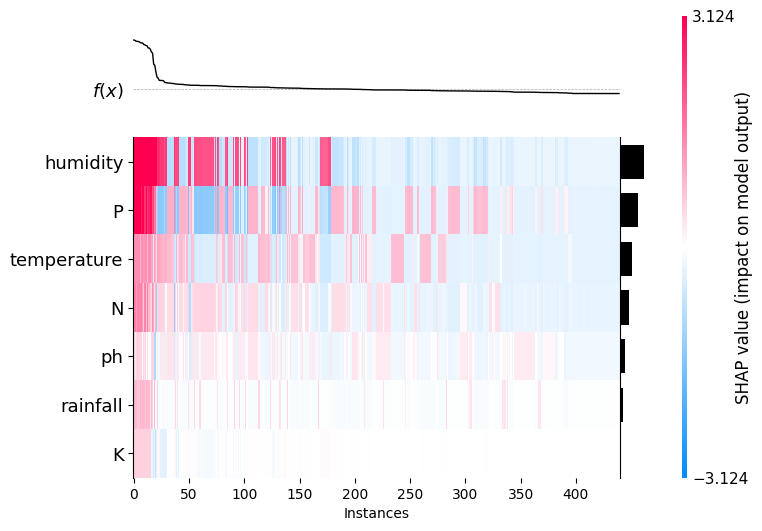

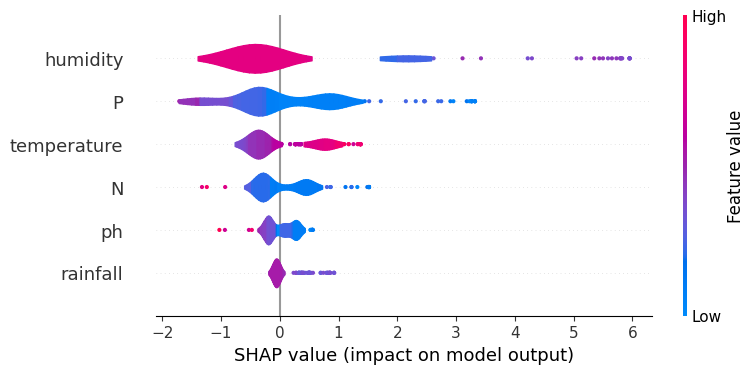

SHAP Plots for label_mothbeans


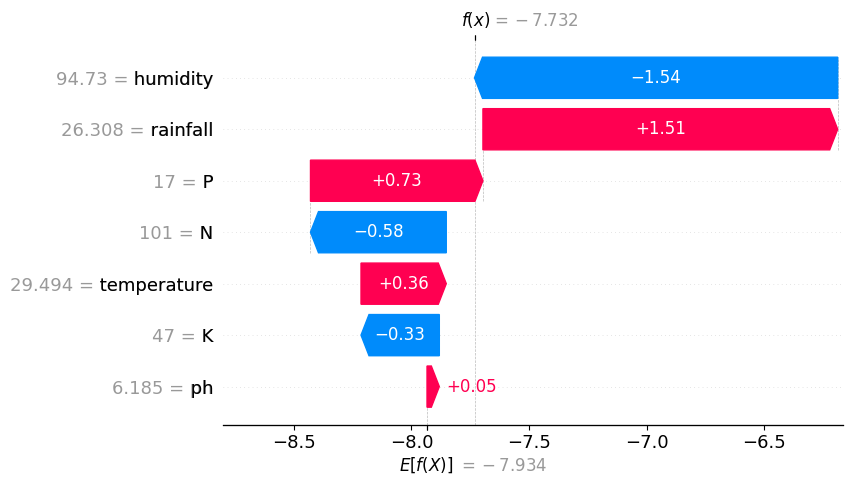

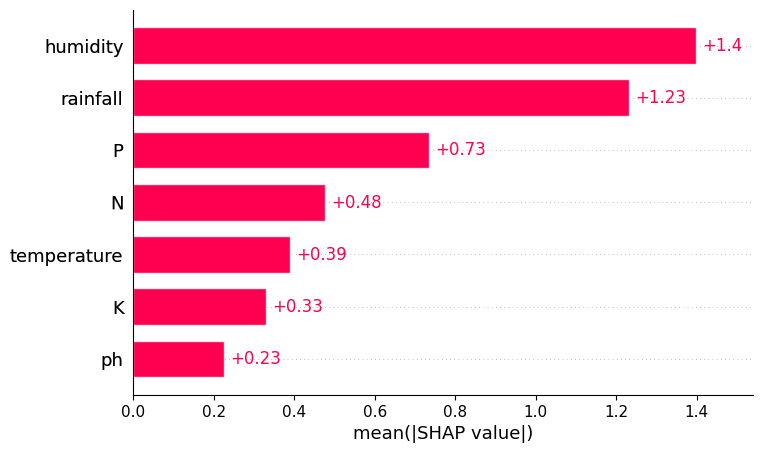

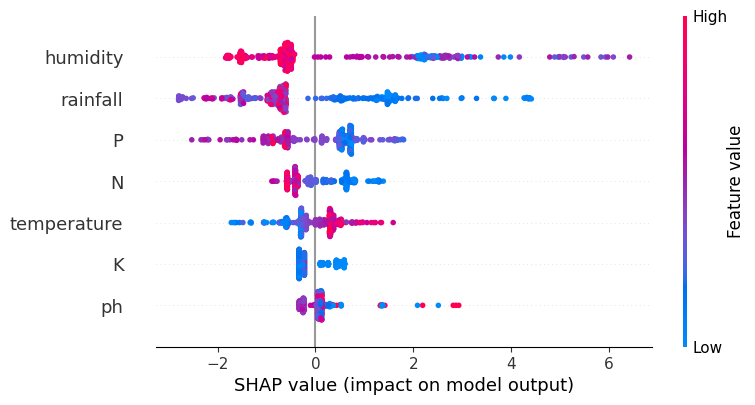

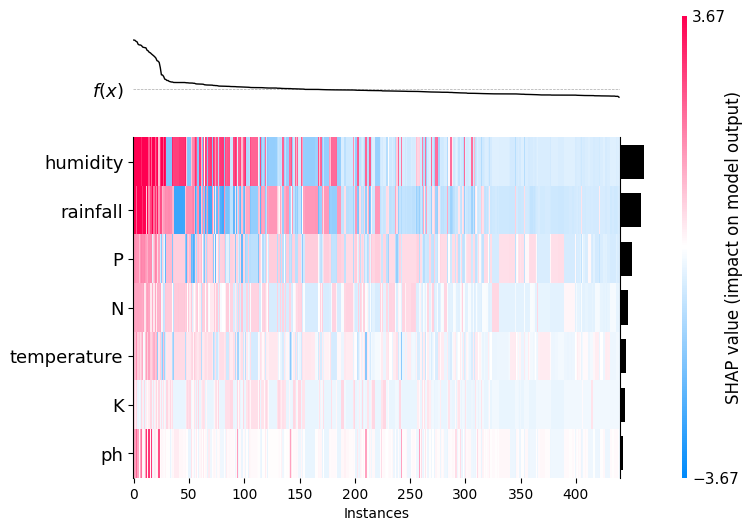

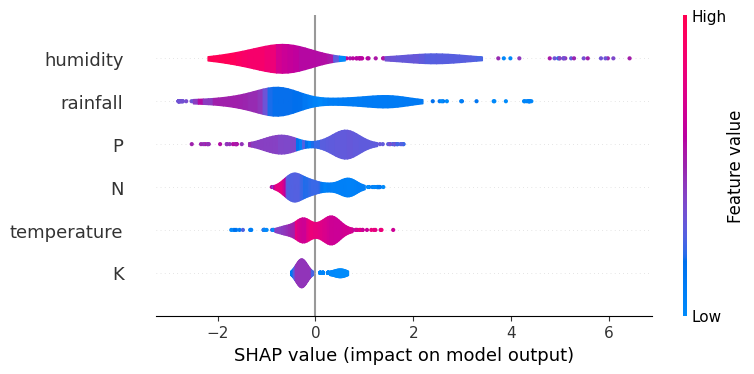

SHAP Plots for label_mungbean


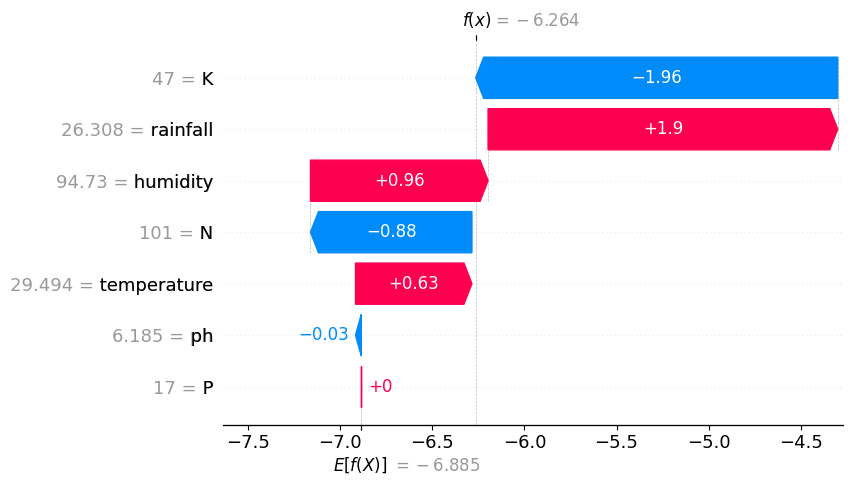

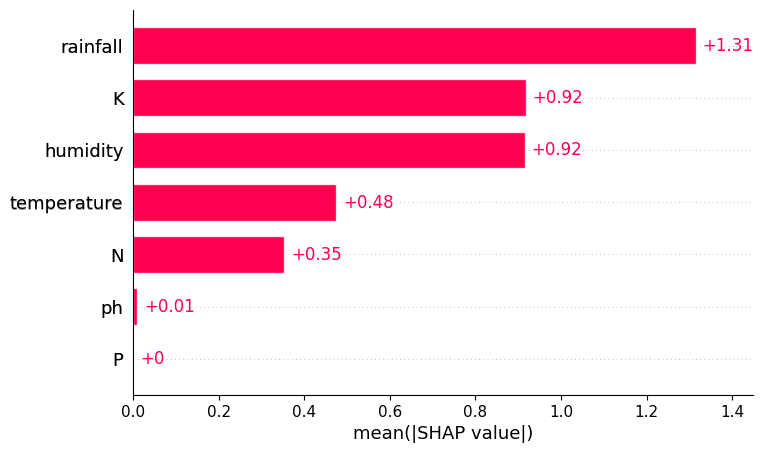

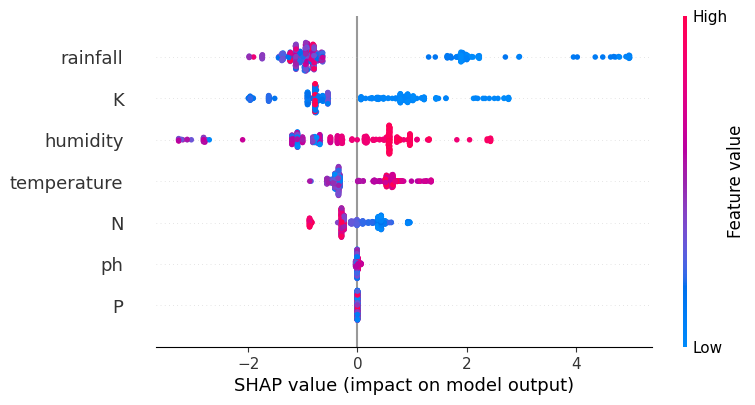

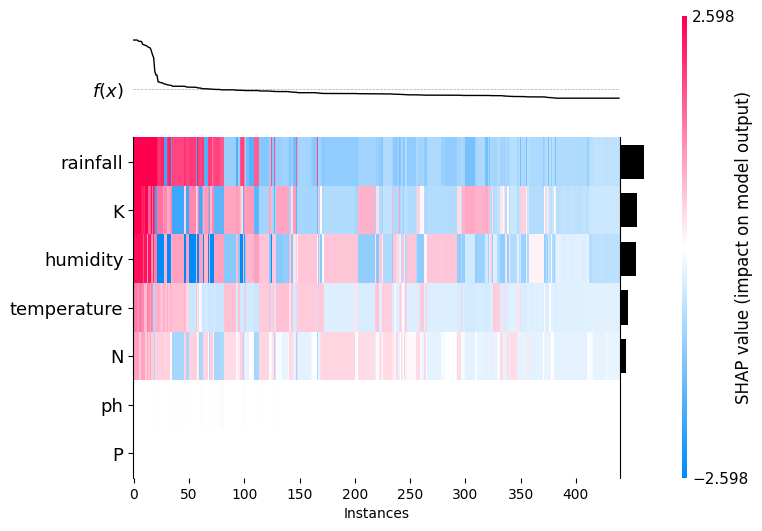

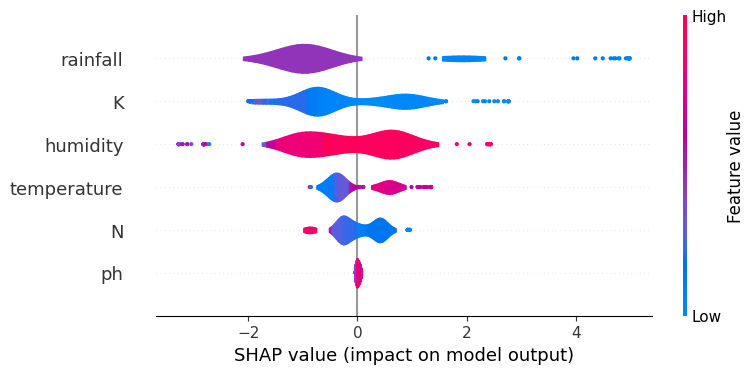

SHAP Plots for label_muskmelon


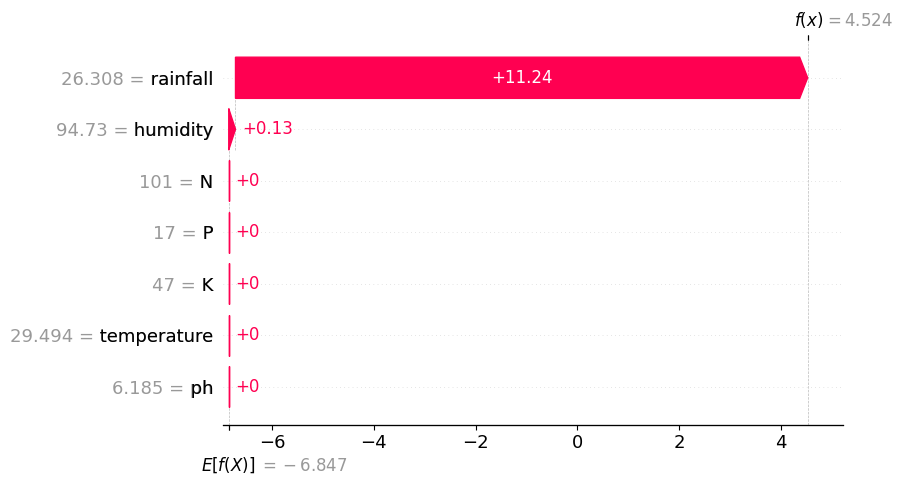

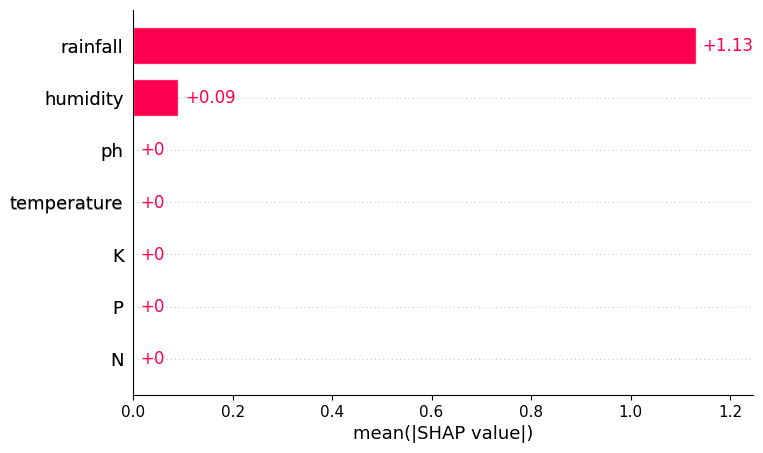

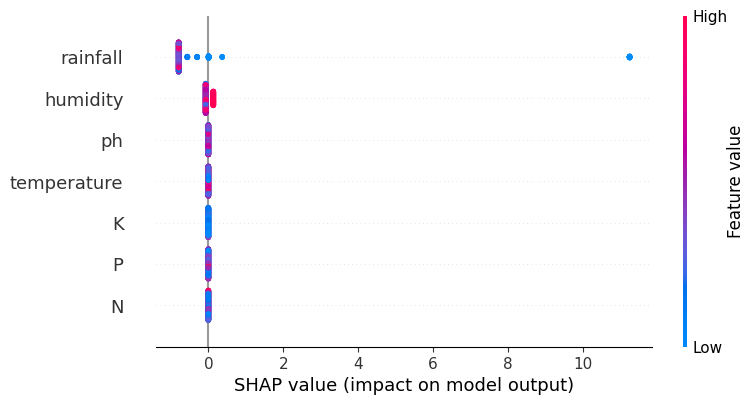

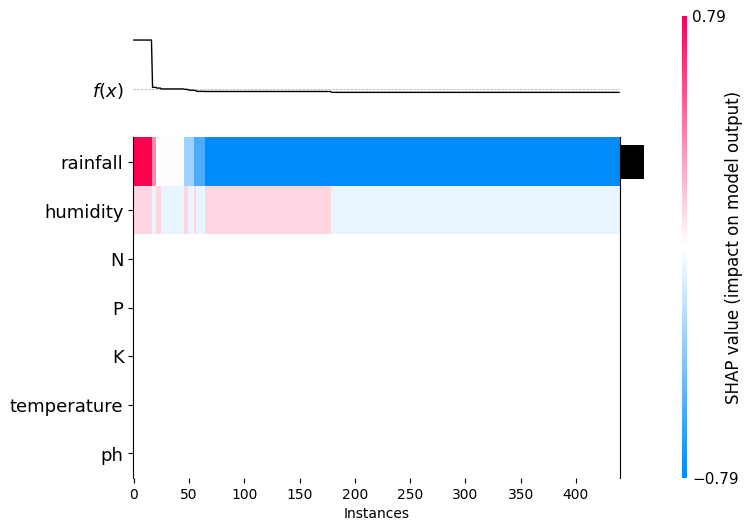

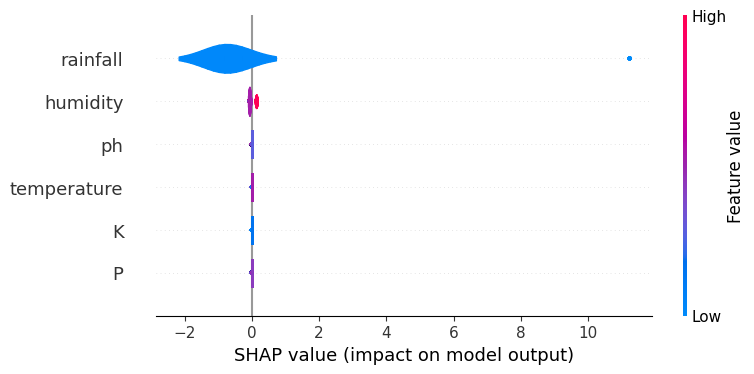

SHAP Plots for label_orange


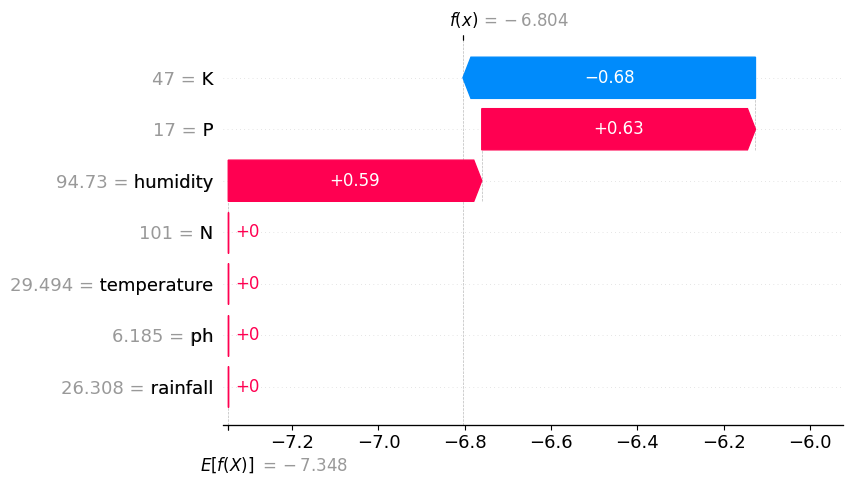

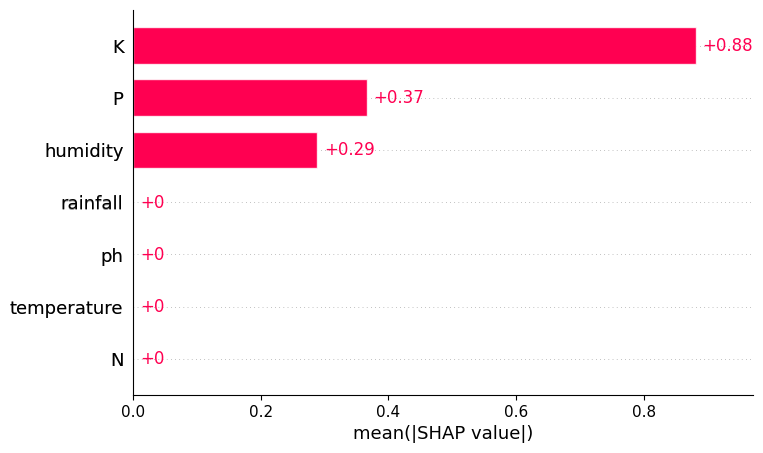

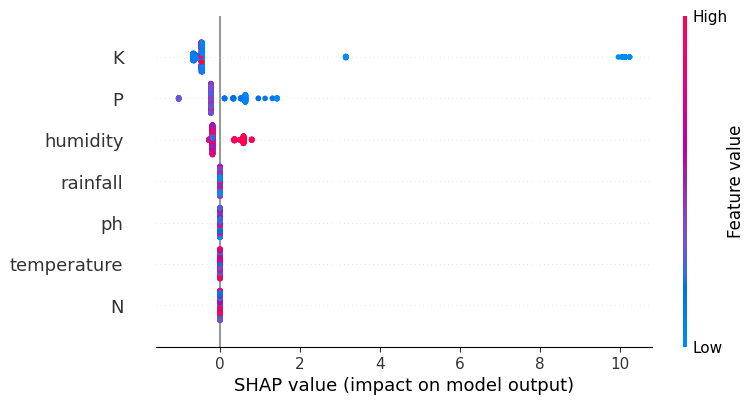

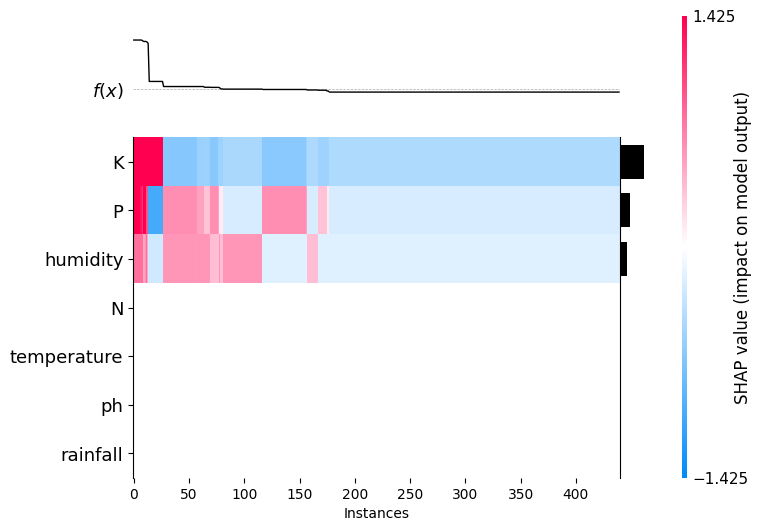

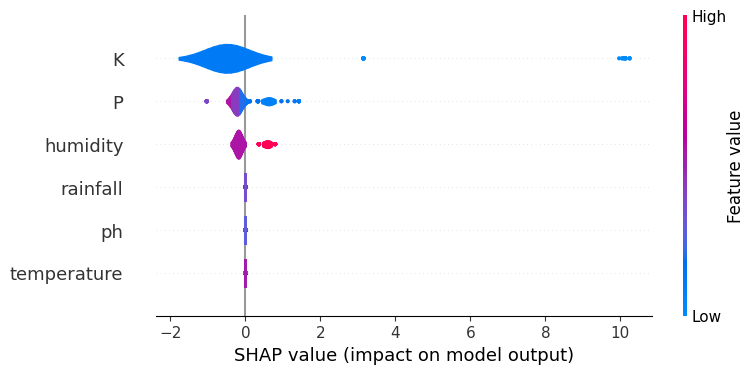

SHAP Plots for label_papaya


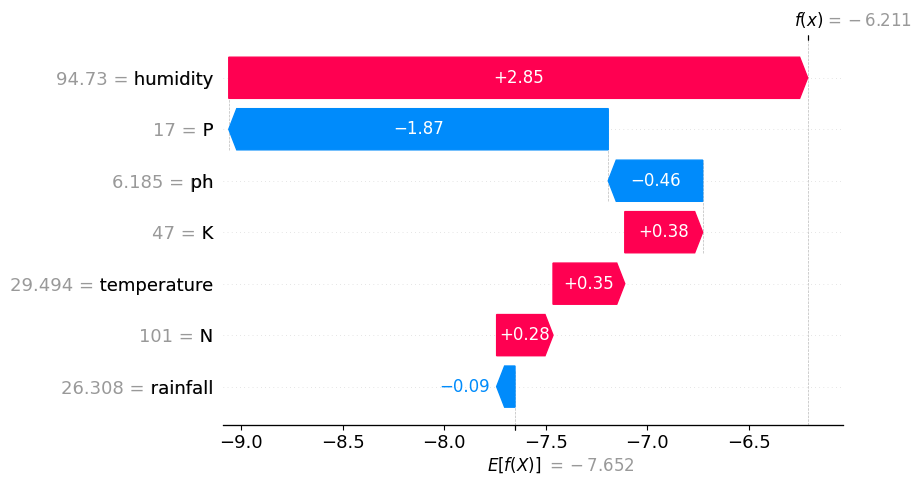

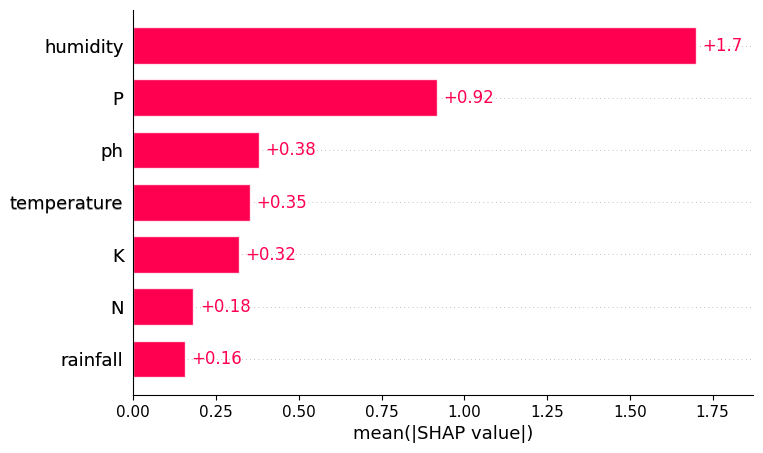

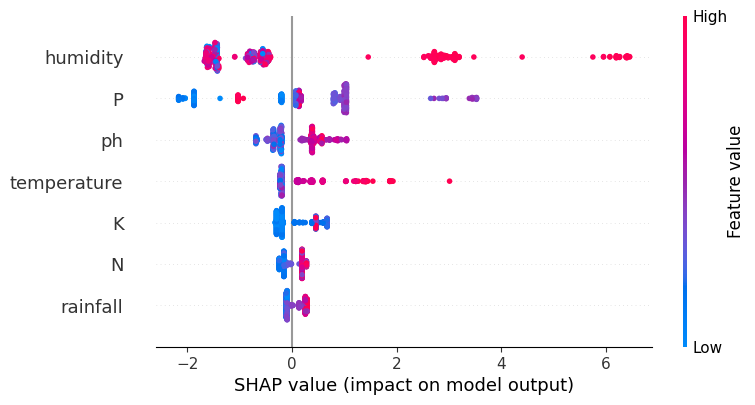

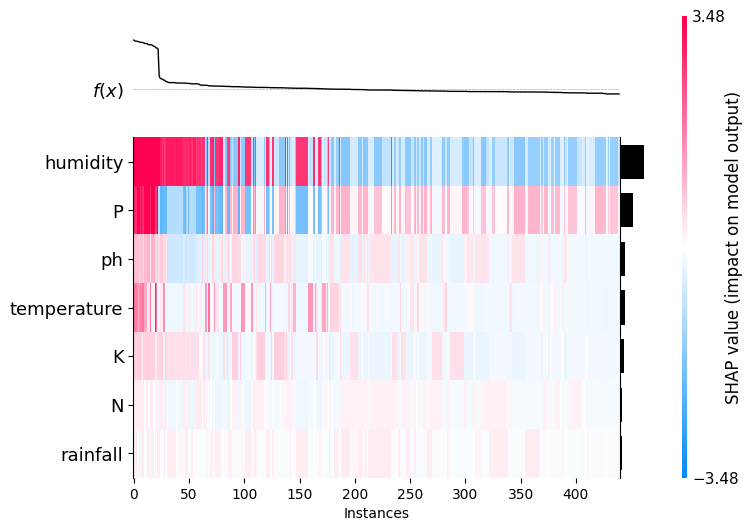

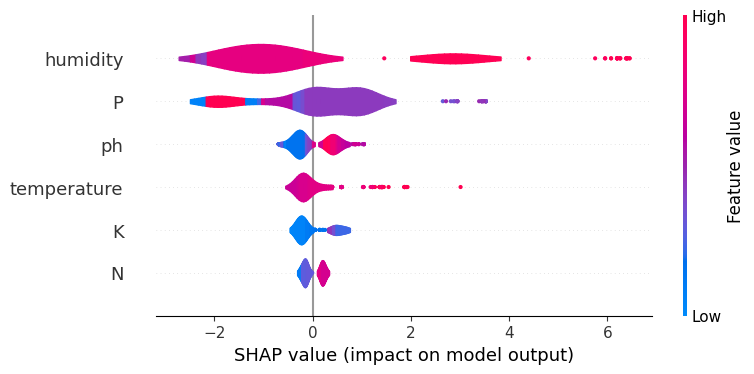

SHAP Plots for label_pigeonpeas


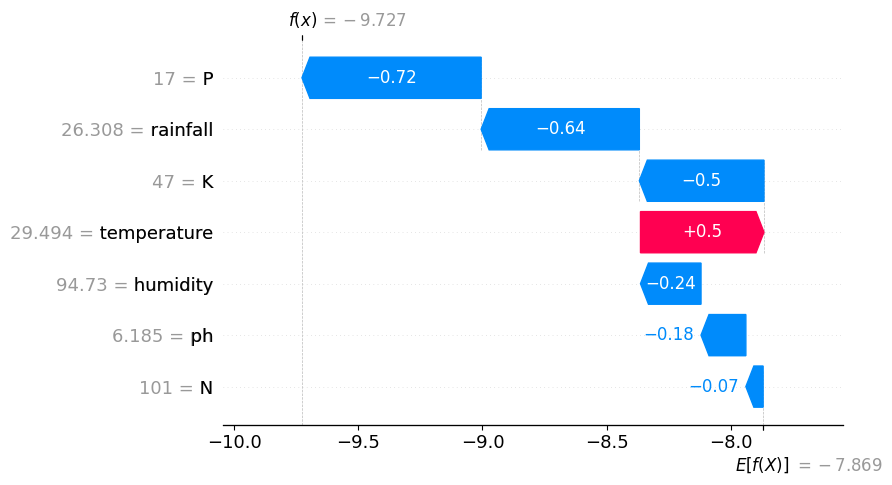

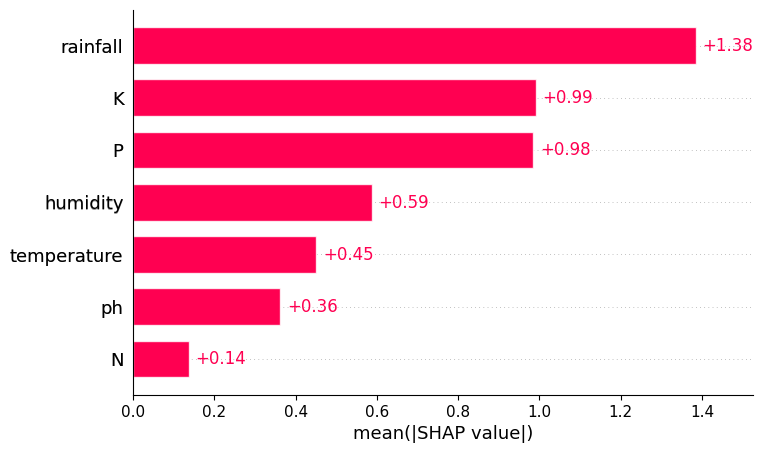

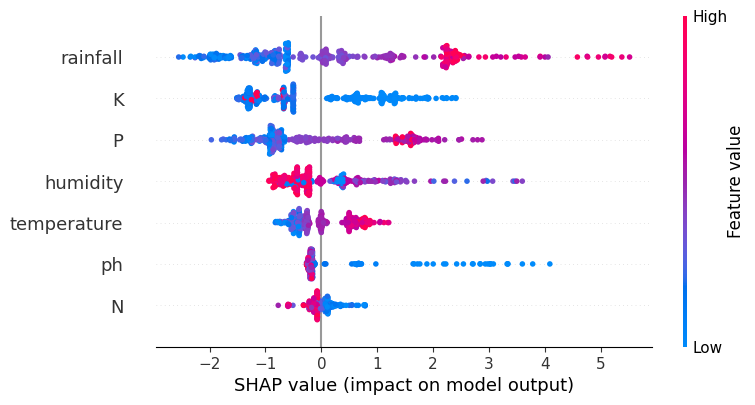

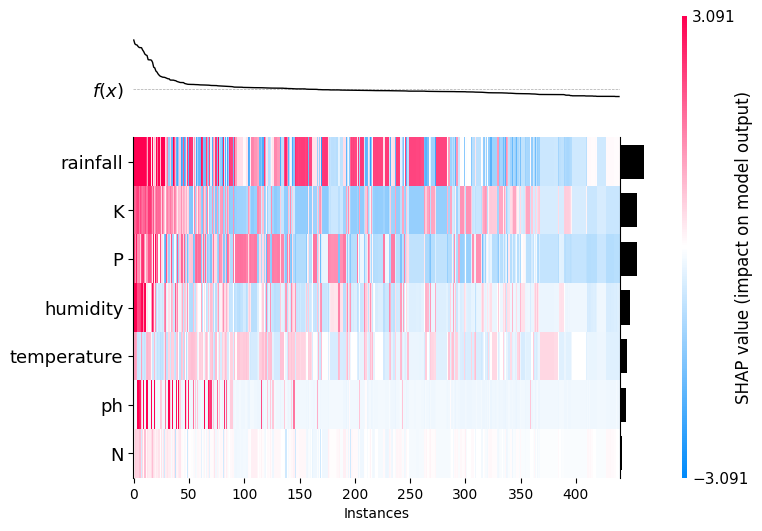

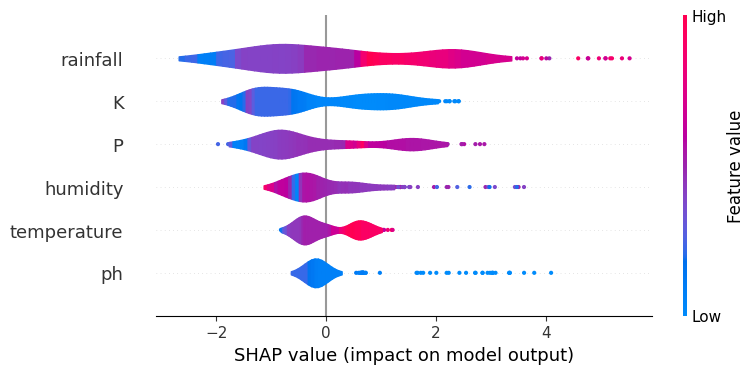

SHAP Plots for label_pomegranate


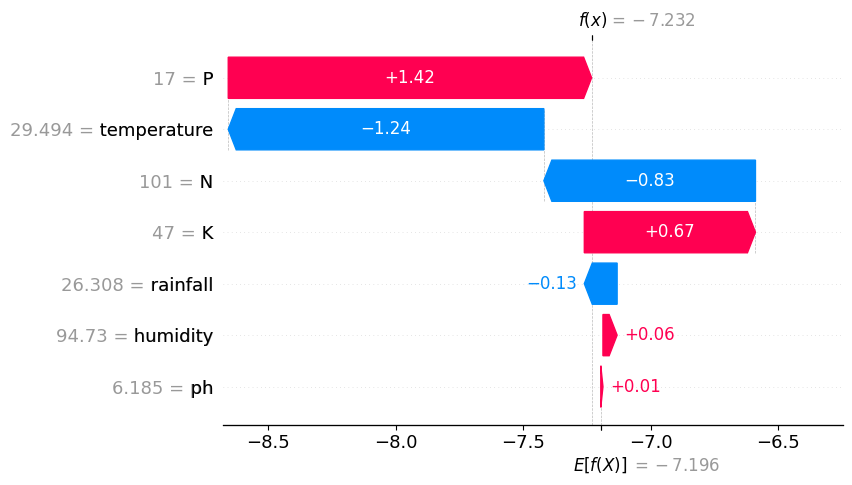

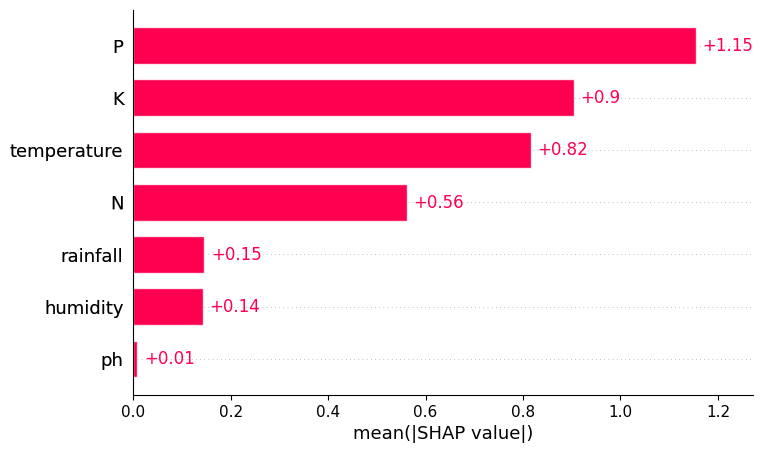

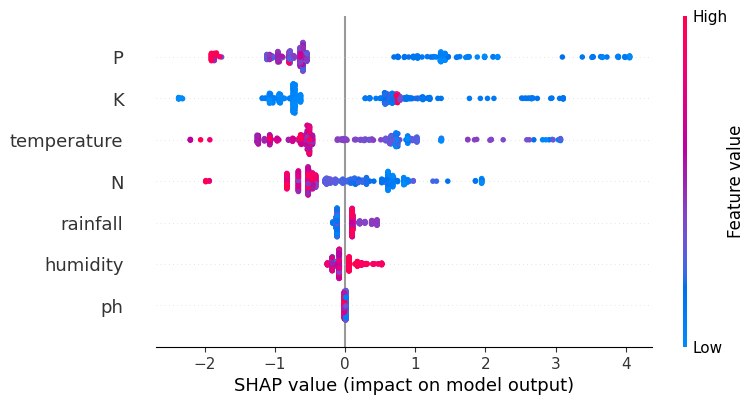

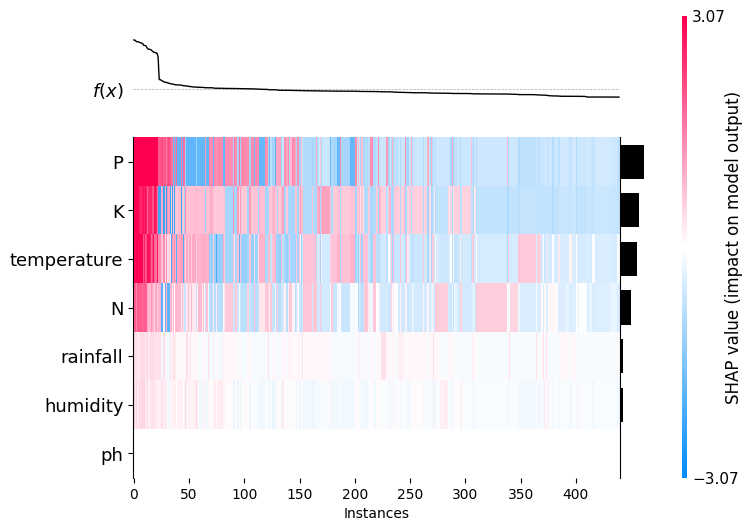

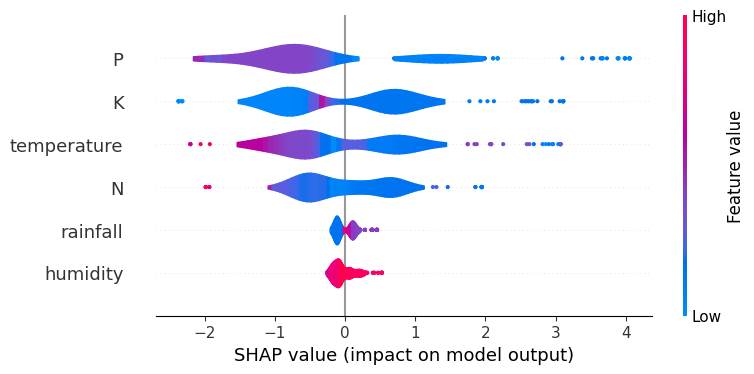

SHAP Plots for label_rice


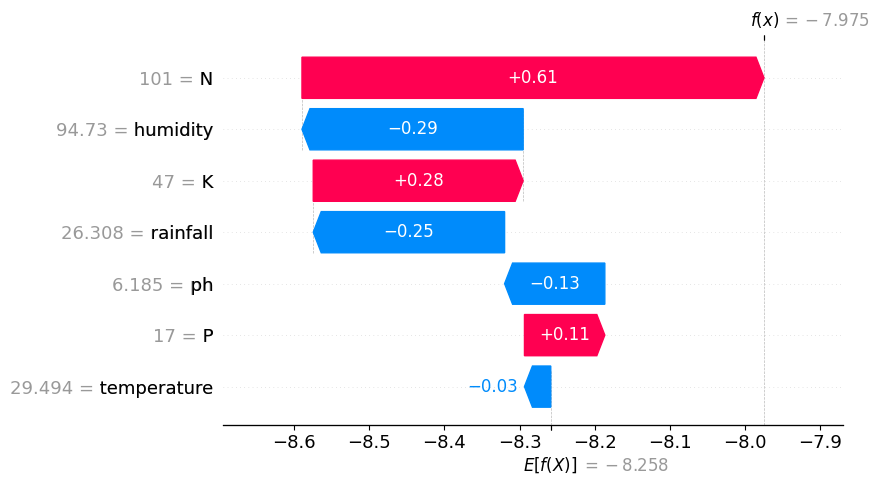

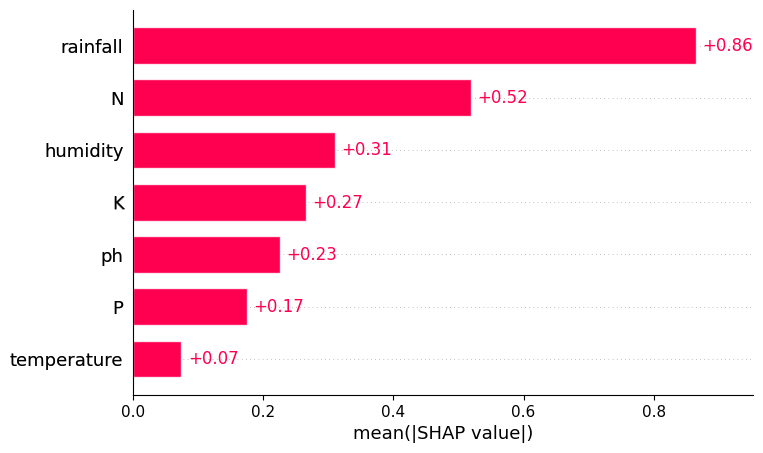

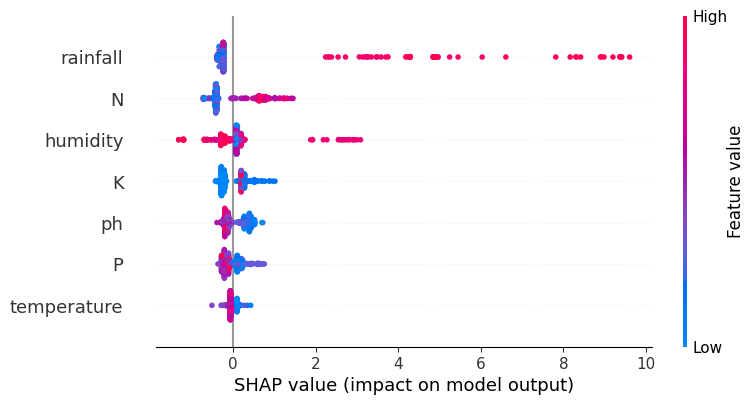

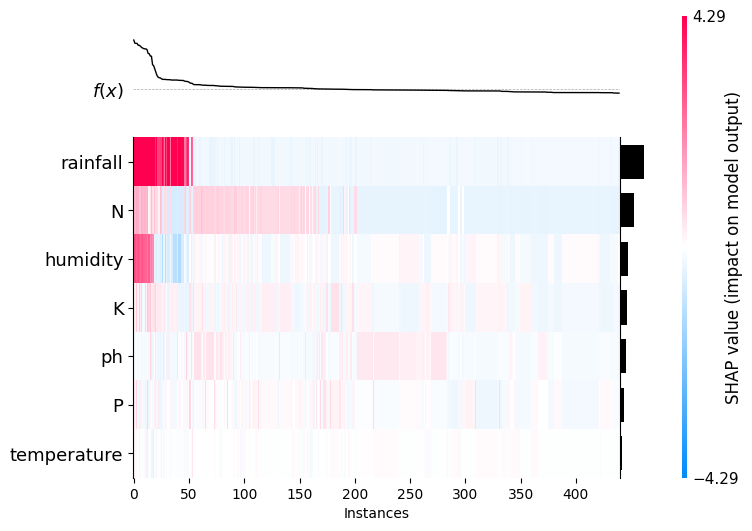

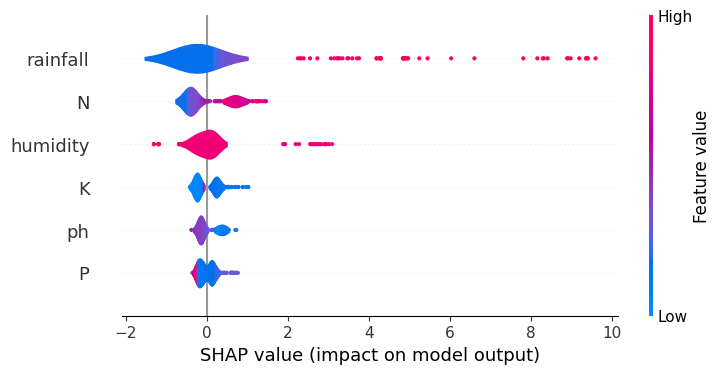

SHAP Plots for label_watermelon


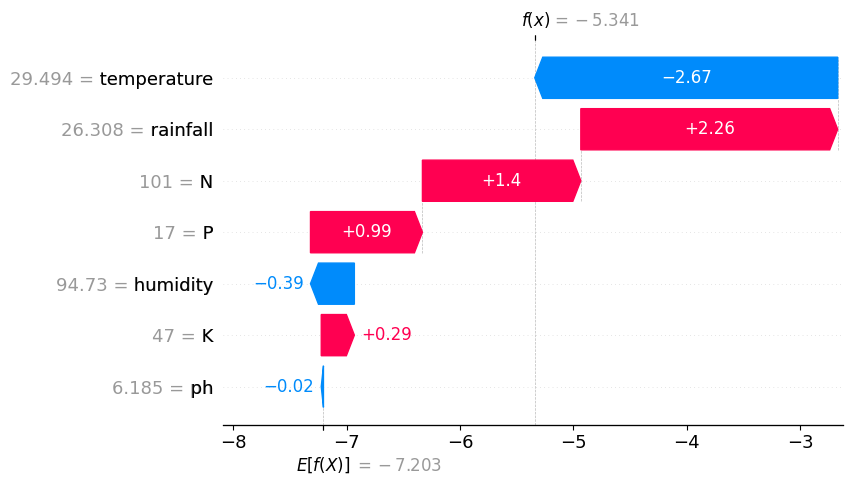

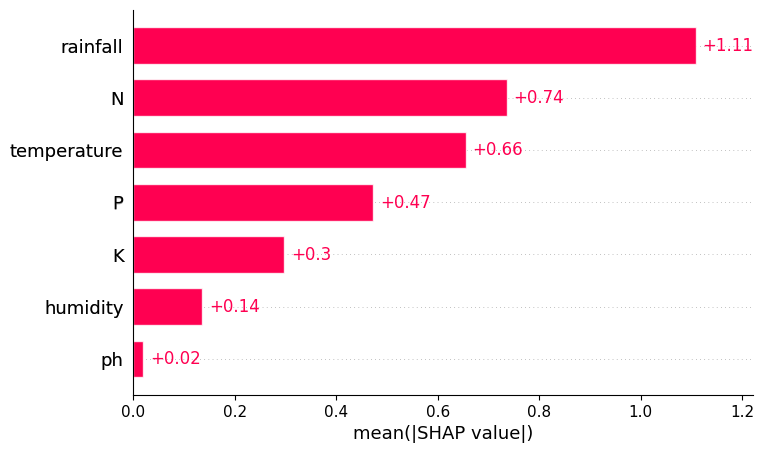

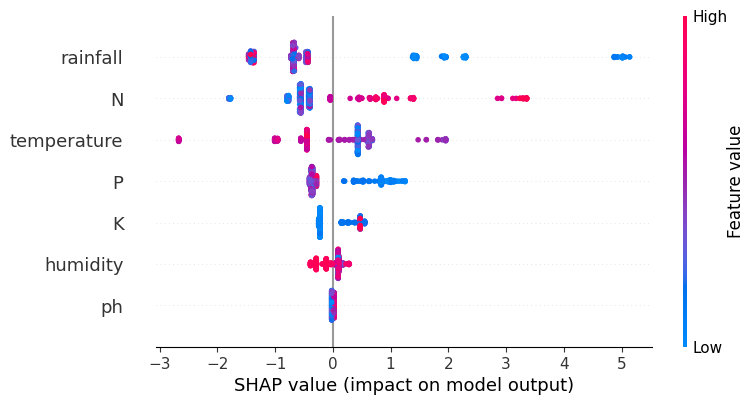

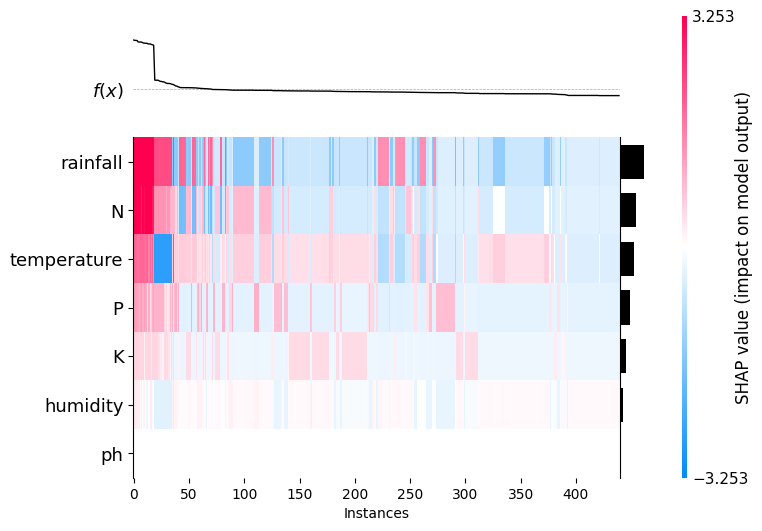

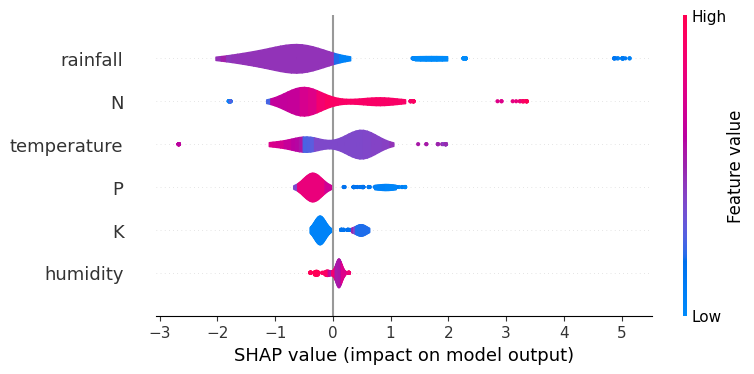

SHAP analysis completed for all labels.


In [81]:
import shap
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import xgboost as xgb

X = data_encoded[['N', 'P', 'K', 'temperature', 'humidity', 'ph', 'rainfall']]
labels = [col for col in data_encoded.columns if col.startswith('label_')]

for label in labels:
    print(f"SHAP Plots for {label}")
    y = data_encoded[label]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    model = xgb.XGBClassifier(n_estimators=100, random_state=42, use_label_encoder=False, eval_metric='logloss')
    model.fit(X_train, y_train)
    explainer = shap.Explainer(model, X_test)
    shap_values = explainer(X_test)
    shap.initjs()
    plt.figure(figsize=(10, 6))
    shap.plots.waterfall(shap_values[0])
    plt.title(f"Waterfall Plot for {label}")
    plt.close()
    plt.figure(figsize=(10, 6))
    shap.plots.bar(shap_values)
    plt.title(f"Bar Plot for {label}")
    plt.close()
    plt.figure(figsize=(10, 6))
    shap.plots.beeswarm(shap_values, max_display=20)
    plt.title(f"Beeswarm Plot for {label}")
    plt.close()
    plt.figure(figsize=(10, 6))
    shap.plots.heatmap(shap_values, instance_order=shap_values.sum(1))
    plt.title(f"Heatmap Plot for {label}")
    plt.close()
    plt.figure(figsize=(10, 6))
    shap.plots.violin(shap_values, max_display=6)
    plt.title(f"Violin Plot for {label}")
    plt.close()
print("SHAP analysis completed for all labels.")


In [82]:
shap_values.shape

(440, 7)